# Mentions graph analisys

In [2]:
import pandas as pd
import networkx as nx
import numpy as np
import time
import pickle
import re
import matplotlib.pyplot as plt

from networkx.algorithms.community import greedy_modularity_communities, louvain_communities, modularity
from collections import Counter

## Loading data

In [3]:
theme = 'WorldCup'

In [4]:
tweets = pd.read_csv(f'./data/{theme}/tweets.csv')
users = pd.read_csv(f'./data/{theme}/users.csv')

In [5]:
# considering bot users us those with less than 100 followers
bot_users = users[users['followers_count'] <= 100]

In [6]:
bot_users

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
2,1591065849531604994,mistresslily85,2022-11-11 13:50:48+00:00,0,5,7,False,False
5,968203797049769984,JorgeXO1,2018-02-26 19:19:08+00:00,13,100,2769,False,False
7,1585336194010955781,FIFAWCBot,2022-10-26 18:23:26+00:00,1,4,7,False,False
19,1555989425414455298,EpicoSports,2022-08-06 18:49:35+00:00,36,111,134,False,False
27,1015663363622408196,Xavo_593,2018-07-07 18:26:30+00:00,96,71,6551,False,False
...,...,...,...,...,...,...,...,...
142492,2326428333,fernn_jose,2014-02-05 17:57:58+00:00,37,130,351,False,False
142494,1502549300752306180,evaleansx,2022-03-12 07:37:40+00:00,2,6,11,False,False
142495,1604999869642555396,LeddsoDello,2022-12-20 00:39:48+00:00,3,25,5,False,False
142497,1431768168272388099,BoudabousRamy,2021-08-28 23:58:54+00:00,8,98,27,False,False


In [7]:
users = users.drop_duplicates(subset=['id'])

In [8]:
tweets.isna().sum()

hashtag               0
id                    0
author_id             0
text                  0
like_count            0
reply_count           0
retweet_count         0
quote_count           0
created_at            0
lang                  0
mentions         262407
dtype: int64

In [9]:
tweets.dropna(inplace=True)

## Getting users language

In [10]:
author_nationality_raw = tweets[['author_id', 'lang']]

In [11]:
author_nationality_raw.drop_duplicates(['author_id', 'lang'])

,author_id,lang
12,230186918,ar
17,928683542904700928,en
18,745524289,ar
25,1219851875408846848,ar
28,266652243,ar
...,...,...
332521,210112513,es
332526,2399964980,und
332560,1547488978365988866,cs
332570,292039241,ar


In [12]:
dummies_nationalities = pd.get_dummies(author_nationality_raw)

In [13]:
dummies_nationalities

,author_id,lang_am,lang_ar,lang_bn,lang_ca,lang_ckb,lang_cs,lang_cy,lang_da,lang_de,...,lang_ta,lang_te,lang_th,lang_tl,lang_tr,lang_uk,lang_und,lang_ur,lang_vi,lang_zh
12,230186918,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17,928683542904700928,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18,745524289,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25,1219851875408846848,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
28,266652243,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332573,1499701605079396353,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
332577,1567287154027515905,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
332585,1363653333479788549,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
332586,1522221998151061509,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
author_and_lang_number_df = dummies_nationalities.groupby(by=['author_id']).sum()

In [15]:
user_lang = {author_id: np.argmax(languages) for author_id, languages in author_and_lang_number_df.iterrows()}

In [16]:
user_lang

{69243: 11,
 106053: 8,
 591313: 11,
 628073: 11,
 743273: 11,
 785814: 11,
 794815: 11,
 1217511: 11,
 1621271: 11,
 2005421: 33,
 2062041: 8,
 2796681: 12,
 2884771: 11,
 3362741: 12,
 3428001: 12,
 3538711: 11,
 3575001: 12,
 5186221: 12,
 5206861: 12,
 5577632: 12,
 5623582: 25,
 5653872: 11,
 5690142: 11,
 5720502: 11,
 5740092: 11,
 5775802: 11,
 5827072: 25,
 5861142: 12,
 6604232: 17,
 7063882: 12,
 7158022: 11,
 7170602: 17,
 7235612: 11,
 7405152: 11,
 7589572: 11,
 7668952: 12,
 7695902: 12,
 7780042: 11,
 7833422: 12,
 7996082: 12,
 7996522: 12,
 8001112: 23,
 8091552: 12,
 8225692: 12,
 8244182: 37,
 8407352: 37,
 8545122: 12,
 8547752: 11,
 8775322: 11,
 8974582: 11,
 9688522: 21,
 9706822: 12,
 9732652: 17,
 9746232: 12,
 9794062: 7,
 9828412: 11,
 9905942: 12,
 10012122: 12,
 10417232: 12,
 10653662: 12,
 10987102: 12,
 11138822: 33,
 11437712: 11,
 11752512: 17,
 12021602: 11,
 12365292: 11,
 12395662: 23,
 12413752: 37,
 12416472: 12,
 12542362: 11,
 12545522: 38,
 12

In [17]:
user_lang_english_discrim = {}

for author_id, languages in author_and_lang_number_df.iterrows():
    no_eng_languages = languages.drop('lang_en')
    
    # since english is so popular language and people from all over the world use it
    # I distinguish english from other languages
    
    # if user posted any tweets in language diffrent that english
    if max(no_eng_languages) > 0:
        user_lang_english_discrim[author_id] = np.argmax(no_eng_languages)
    else:
        # if not we take the most used language except english
        # all the indecies from 0 to len(no_eng_languages) migth be used so we assign a new one
        user_lang_english_discrim[author_id] = len(no_eng_languages)
        

In [18]:
# making a list which let to get language by index 
# keeping in mind that english is the last one
languages_list = list(author_and_lang_number_df.loc[69243].drop('lang_en').index)
languages_list.append('lang_en')
languages_list

['lang_am',
 'lang_ar',
 'lang_bn',
 'lang_ca',
 'lang_ckb',
 'lang_cs',
 'lang_cy',
 'lang_da',
 'lang_de',
 'lang_dv',
 'lang_el',
 'lang_es',
 'lang_et',
 'lang_eu',
 'lang_fa',
 'lang_fi',
 'lang_fr',
 'lang_hi',
 'lang_ht',
 'lang_hu',
 'lang_in',
 'lang_is',
 'lang_it',
 'lang_iw',
 'lang_ja',
 'lang_kn',
 'lang_ko',
 'lang_lt',
 'lang_lv',
 'lang_ml',
 'lang_mr',
 'lang_ne',
 'lang_nl',
 'lang_no',
 'lang_pl',
 'lang_ps',
 'lang_pt',
 'lang_qme',
 'lang_ro',
 'lang_ru',
 'lang_si',
 'lang_sl',
 'lang_sr',
 'lang_sv',
 'lang_ta',
 'lang_te',
 'lang_th',
 'lang_tl',
 'lang_tr',
 'lang_uk',
 'lang_und',
 'lang_ur',
 'lang_vi',
 'lang_zh',
 'lang_en']

In [19]:
author_and_lang_number_df[['lang_en', 'lang_es', 'lang_ar']]

,lang_en,lang_es,lang_ar
author_id,,,
69243,3.0,0.0,0.0
106053,0.0,0.0,0.0
591313,1.0,0.0,0.0
628073,1.0,0.0,0.0
743273,1.0,0.0,0.0
...,...,...,...
1605329362055725057,0.0,0.0,0.0
1605387946479190016,0.0,1.0,0.0
1605395560432795648,1.0,0.0,0.0


In [20]:
author_nationality_raw.groupby(by=['lang'], as_index=False).count().sort_values(by=['author_id'])

,lang,author_id
4,ckb,1
46,te,1
36,ps,1
41,si,1
32,ne,2
9,dv,2
50,uk,3
26,kn,4
22,is,4
0,am,6


## Mention to graph extraction

In [21]:
mentions_df_raw = tweets[['author_id', 'mentions']]

In [22]:
bot_users['id'].values

array([1591065849531604994,  968203797049769984, 1585336194010955781, ...,
       1604999869642555396, 1431768168272388099, 1337398183857692672],
      dtype=int64)

In [23]:
mentions_df_raw.sort_values('author_id')

,author_id,mentions
212137,69243,['704275542648819712']
225894,69243,['1186729338424713216']
98923,69243,['14589119']
280227,106053,"['78270570', '1560191206080094208', '1482430766']"
139688,591313,"['325516772', '1347250338', '2544159769']"
...,...,...
316582,1605414638577143808,"['1494298221107200000', '370944865']"
316580,1605414638577143808,['283163729']
316574,1605414638577143808,['1587592259737894912']
316603,1605414638577143808,"['1166041850999754752', '357211620']"


In [24]:
mentions_df = mentions_df_raw[~mentions_df_raw.author_id.isin(bot_users.id)]

In [25]:
# dealing with how the values in the 'mentions' column are saved
def list_capture(input_str: str):
    input_str = input_str[1:-1]
    just_commas = re.sub('\'', '', input_str)
    str_list = just_commas.split(',')
    
    output_list = []
    for ele in str_list:
        output_list.append(int(ele))

    return output_list

In [26]:
mentions_df['mentions'].iloc[0]

"['2429620166', '353032173', '704275542648819712', '1567884749498204160', '1022056380235018240', '73991669', '138372303']"

In [15]:
list_capture(mentions_df['mentions'].iloc[0])

[2429620166,
 353032173,
 704275542648819712,
 1567884749498204160,
 1022056380235018240,
 73991669,
 138372303]

In [16]:
type(mentions_df['author_id'].iloc[0])

numpy.int64

## Graphs
### Graphs without BOTs

In [196]:
def plot_graph(graph, color_list, filename=None, color_labels={}, edge_color=None, alpha_edges=0.6, alpha_nodes=0.6, node_size=None):
    fig = plt.figure(1, figsize=(20,20))
    
    if type(graph) == nx.classes.digraph.DiGraph: 
        if node_size is None:
            node_size = 50
            
        layout=nx.kamada_kawai_layout(graph)
    else:
        if node_size is None:
            node_size = 10
            
        layout=nx.spring_layout(graph)  
        
    
    # good visibilty aspect
    if len(set(color_list)) > 2:
        colormap=plt.cm.gist_rainbow
    else:
        colormap=plt.cm.copper
    
    if edge_color is None:
        edge_color=plt.cm.Greys(0.2)
        
        
    # some magic to add legend
    ax = fig.add_subplot(1,1,1)
    for label, color in color_labels.items():
        ax.scatter([0], [0],
               color=colormap(color),
               label=label,
               alpha=alpha_nodes)
    
#     nx.draw_networkx(graph, pos=nx.layout, node_size=node_size, node_color=color_list,
#                      cmap=colormap, edge_color=edge_color, ax=ax, with_labels=False, alpha=alpha)
    nx.draw_networkx_nodes(graph, pos=layout, node_size=node_size, node_color=color_list, vmax=1.0, alpha=alpha_nodes, cmap=colormap, ax=ax)
    nx.draw_networkx_edges(graph, pos=layout, edge_color=edge_color, ax=ax, alpha=alpha_edges)
    
    if filename is not None:
        plt.savefig('./graphs/' + filename)
    

    plt.legend()
    ax.axis('off')
    
    plt.show()

In [83]:
raw_undirected = nx.Graph()

In [84]:
for _, row in mentions_df.iterrows():
    mention_ids = list_capture(row['mentions'])
    
    for mention_id in mention_ids:
        raw_undirected.add_edge(row['author_id'], mention_id)

In [85]:
raw_undirected.remove_edges_from(nx.selfloop_edges(raw_undirected))

In [86]:
raw_undirected.remove_nodes_from(list(nx.isolates(raw_undirected)))

In [87]:
mentions_graph = raw_undirected.copy()

In [88]:
mentions_graph.size(), len(mentions_graph.nodes())

(52131, 41148)

In [89]:
for component in list(nx.connected_components(mentions_graph)):
    if len(component) < 1000:
        for node in component:
            mentions_graph.remove_node(node)

In [90]:
# if I get it right it should delete any nodes
# becuase we cannot have isolated user when it comes to mentions
mentions_graph.remove_nodes_from(list(nx.isolates(mentions_graph)))

In [91]:
mentions_graph.remove_edges_from(nx.selfloop_edges(mentions_graph))

In [92]:
mentions_graph.size(), len(mentions_graph.nodes())

(43932, 29596)

In [93]:
low_degree_nodes = [node for node,degree in dict(mentions_graph.degree()).items() if degree <= 3]
len(low_degree_nodes)

25146

In [94]:
high_degree_graph = mentions_graph.copy()

In [95]:
high_degree_graph.remove_nodes_from(low_degree_nodes)

In [96]:
high_degree_graph.size(), len(high_degree_graph.nodes())

(13173, 4450)

In [97]:
for component in list(nx.connected_components(high_degree_graph)):
    if len(component) < 100:
        for node in component:
            high_degree_graph.remove_node(node)

In [98]:
high_degree_graph.size(), len(high_degree_graph.nodes())

(13066, 4168)

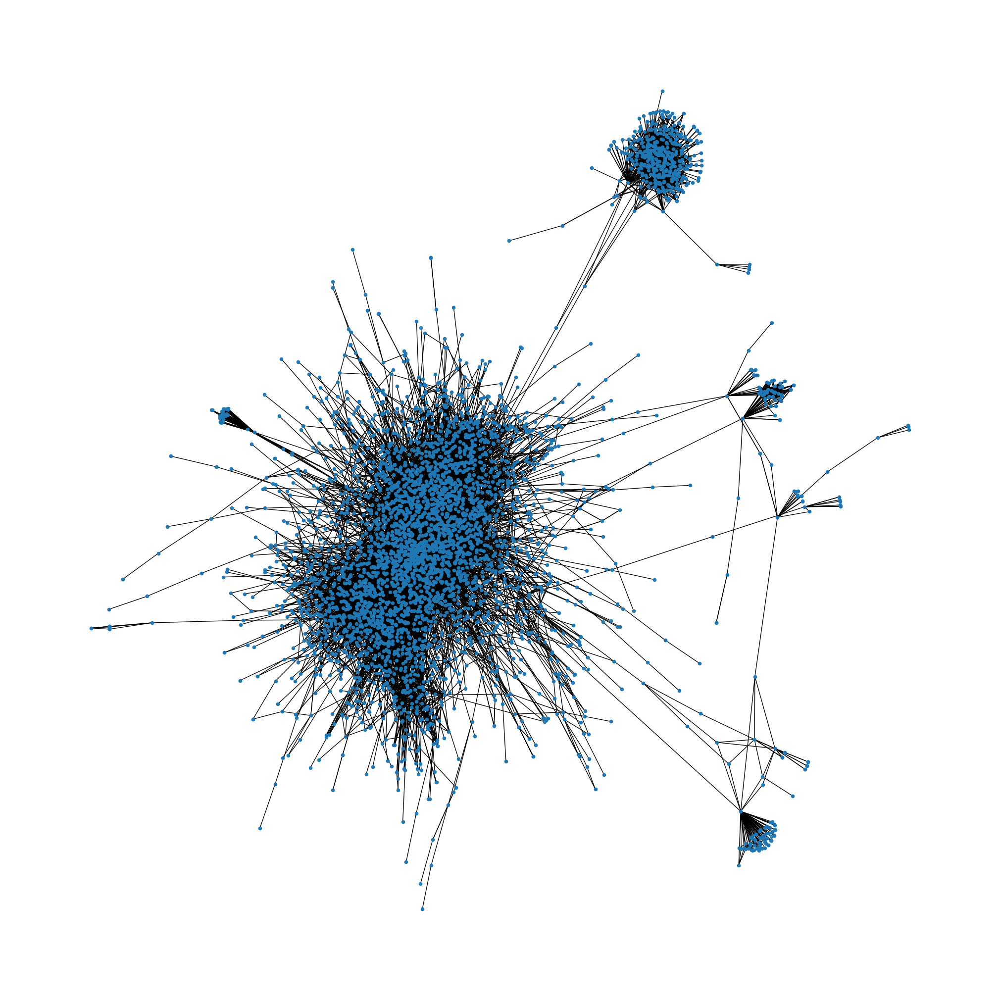

In [34]:
plt.figure(figsize=(20,20))
nx.draw(high_degree_graph, pos=nx.spring_layout(high_degree_graph), node_size=20, with_labels=False, cmap='hsv')
plt.show()

## Centrality

In [74]:
betweenness_centrality = nx.betweenness_centrality(high_degree_graph)

In [76]:
betweenness_centrality_sorted = dict(sorted(betweenness_centrality.items(), key=lambda item: item[1]))

In [79]:
top_10_betweenes_centrality= list(betweenness_centrality_sorted.keys())[:10]
top_10_betweenes_centrality

[928683542904700928,
 15438913,
 246717876,
 486935895,
 52360480,
 20973388,
 9161692,
 153433497,
 1547639240703430656,
 1265117720221286401]

In [80]:
users[users.id.isin(top_10_betweenes_centrality)]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
20,928683542904700928,FlamzespotNg,2017-11-09 17:59:45+00:00,176,571,47696,False,False
147,15438913,MailOnline,2008-07-15 10:17:46+00:00,2794202,2213,481405,False,True
202,246717876,radiomarcabcn,2011-02-03 09:59:12+00:00,14064,472,58078,False,True
225,486935895,Connorbennett10,2012-02-08 20:44:54+00:00,1052,1639,10447,False,False
278,52360480,JeremyVineOn5,2009-06-30 10:25:40+00:00,155674,4175,31972,False,True
545,20973388,LBC,2009-02-16 09:36:59+00:00,610173,2215,215667,False,True
565,9161692,Chivas,2007-09-29 18:10:28+00:00,4147761,160,116323,False,True
572,153433497,maluma,2010-06-08 14:51:21+00:00,8334524,115,20557,False,True
688,1547639240703430656,fmlr88_A,2022-07-14 17:49:17+00:00,7450,7444,19260,False,False
703,1265117720221286401,MubarakAlanaz16,2020-05-26 03:09:31+00:00,28878,27924,197338,False,False


In [ ]:
degree_centrality = nx.degree_centrality(high_degree_graph)

In [85]:
users[users.id == max(degree_centrality)]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
124435,1599753147861422087,LeeAndersonMP_,2022-12-05 13:10:57+00:00,33843,118,146,False,False


In [86]:
closeness_centrality = nx.closeness_centrality(high_degree_graph)

In [91]:
closeness_centrality_sorted = dict(sorted(closeness_centrality.items(), key=lambda item: item[1]))
top_10_closeness_centrality = list(closeness_centrality_sorted.keys())[:10]

In [92]:
users[users.id.isin(top_10_closeness_centrality)]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
56596,475702383,viansofyan7777,2012-01-27 10:32:42+00:00,149,3929,8239,False,False
57419,1204813233699188737,rianss77,2019-12-11 17:20:49+00:00,164,2676,4245,False,False
57431,1575442368232235008,firojfs76,2022-09-29 11:08:43+00:00,194,758,3036,False,False
57742,1205563921962168320,dewisan37498860,2019-12-13 19:03:45+00:00,257,2046,5281,False,False
57767,1570285721285689347,MDAlomg51835918,2022-09-15 05:38:33+00:00,101,1346,3991,False,False
82311,1442731439284318208,najmul0077,2021-09-28 06:03:09+00:00,155,3417,8629,False,False
82454,1492805926990278656,Raju7185,2022-02-13 10:20:52+00:00,158,4000,9778,False,False
101489,1189582232895348736,Angaraerdo,2019-10-30 16:38:15+00:00,101,393,6222,False,False
118146,1301239929486430208,keithdaryls,2020-09-02 19:25:57+00:00,428,162,1246,False,False
137978,1072171637557075968,mahmutseker1972,2018-12-10 16:50:13+00:00,654,1331,18292,False,False


### Language graph

In [50]:
lang_colors = []

for node in high_degree_graph:
    try:
        lang_colors.append(user_lang[node])
    except KeyError:
        # some of the mentioned users haven't posted a tweet then we still want to keep them but with a diffrent color
        lang_colors.append(len(languages_list))
    
lang_colors

[1,
 55,
 1,
 11,
 55,
 11,
 55,
 11,
 11,
 55,
 1,
 1,
 1,
 55,
 55,
 1,
 17,
 12,
 12,
 1,
 1,
 51,
 55,
 55,
 55,
 12,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 43,
 12,
 55,
 11,
 55,
 55,
 12,
 55,
 11,
 55,
 11,
 11,
 55,
 55,
 55,
 55,
 55,
 11,
 55,
 11,
 55,
 1,
 12,
 55,
 55,
 55,
 55,
 6,
 11,
 55,
 11,
 11,
 55,
 55,
 55,
 55,
 55,
 2,
 55,
 55,
 55,
 55,
 55,
 11,
 55,
 55,
 55,
 55,
 55,
 55,
 51,
 55,
 11,
 55,
 55,
 55,
 55,
 11,
 55,
 55,
 11,
 8,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 12,
 55,
 55,
 55,
 55,
 23,
 11,
 11,
 55,
 11,
 11,
 55,
 55,
 12,
 55,
 55,
 55,
 55,
 55,
 11,
 11,
 55,
 11,
 55,
 12,
 55,
 55,
 11,
 55,
 55,
 55,
 11,
 55,
 55,
 11,
 11,
 11,
 55,
 55,
 55,
 55,
 55,
 38,
 55,
 55,
 55,
 55,
 55,
 55,
 11,
 55,
 55,
 55,
 55,
 11,
 55,
 55,
 11,
 11,
 11,
 55,
 55,
 11,
 55,
 55,
 55,
 55,
 11,
 11,
 55,
 11,
 55,
 11,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 55,
 11,
 11,
 55,
 11,
 55,
 11,
 55,
 55,
 55,
 55,
 55,
 11,
 11,
 11,
 5

In [51]:
len(lang_colors)

4168

In [52]:
Counter(lang_colors)

Counter({1: 97,
         55: 1226,
         11: 1296,
         17: 171,
         12: 891,
         51: 41,
         43: 1,
         6: 4,
         2: 3,
         8: 56,
         23: 65,
         38: 87,
         33: 19,
         49: 24,
         20: 2,
         37: 60,
         18: 6,
         35: 26,
         29: 8,
         7: 4,
         21: 16,
         19: 6,
         42: 1,
         3: 11,
         25: 12,
         27: 2,
         48: 4,
         16: 2,
         15: 4,
         40: 7,
         14: 3,
         5: 1,
         52: 1,
         44: 1,
         10: 1,
         30: 1,
         54: 7,
         31: 1})

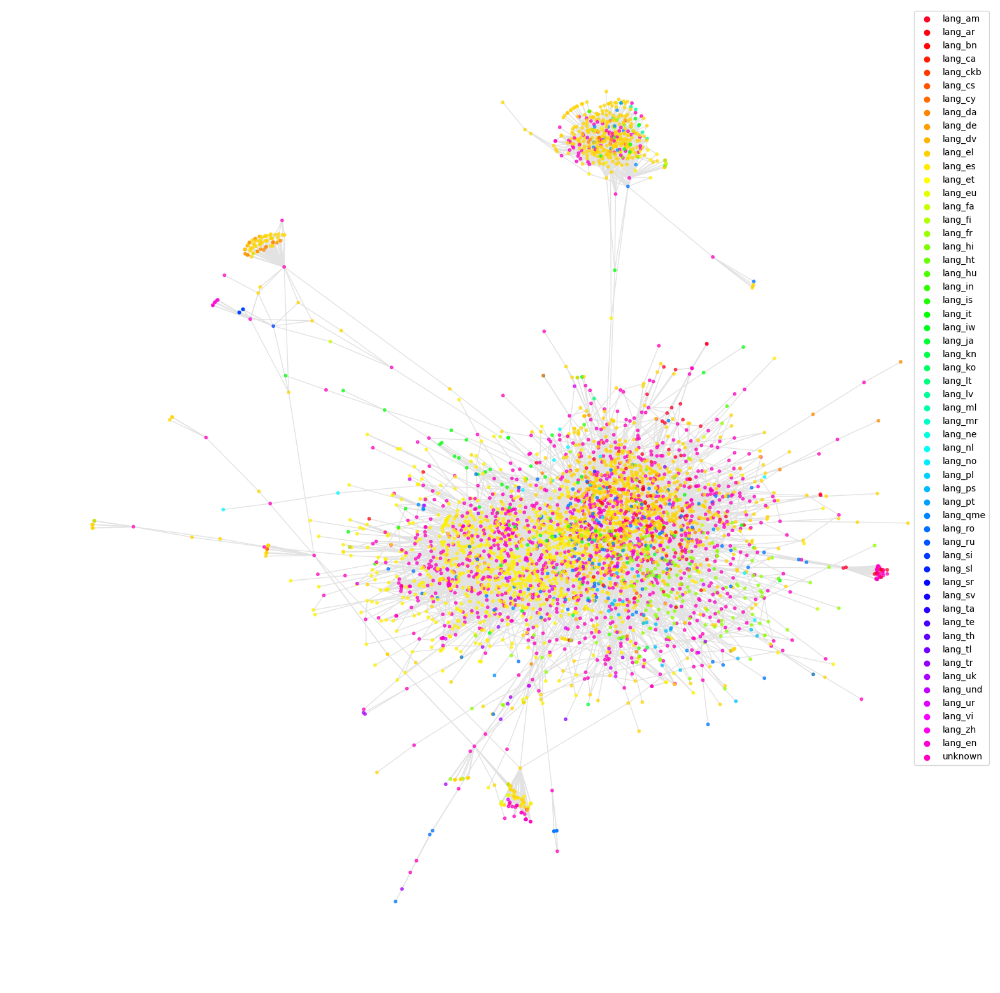

In [87]:
# WROOOOOOOOONG! ENGLISH IS IN THE 11 INDEX AND IS TAKE AD IN language list!!!
plot_graph(high_degree_graph, lang_colors, color_labels=language_color_dict, filename='language-graph-high-degree.png')

### English distinguished language graph

In [48]:
lang_colors_eng = []

for node in high_degree_graph:
    try:
        lang_colors_eng.append(user_lang_english_discrim[node])
    except KeyError:
        # some of the mentioned users haven't posted a tweet then we still want to keep them but with a diffrent color
        # why 27- it is number which aren't many used languages so it will be better visiable on the graph
        lang_colors_eng.append(27)

In [49]:
Counter(lang_colors_eng)

Counter({1: 99,
         27: 1227,
         54: 1005,
         12: 5,
         16: 202,
         11: 954,
         50: 63,
         42: 1,
         14: 7,
         6: 4,
         37: 117,
         2: 3,
         8: 68,
         22: 75,
         19: 3,
         32: 22,
         48: 28,
         5: 2,
         36: 71,
         17: 11,
         34: 28,
         15: 14,
         7: 9,
         28: 15,
         13: 7,
         20: 51,
         47: 12,
         53: 9,
         18: 6,
         33: 2,
         41: 1,
         3: 13,
         26: 3,
         24: 14,
         51: 3,
         29: 2,
         39: 9,
         43: 1,
         10: 1,
         30: 1})

In [50]:
# we have to scale the color dicted since it is used in ax.plot separatly so it is not scaled well
language_color_dict = {lang: index/len(languages_list) for index, lang in enumerate(languages_list)}
# users that haven't posted and tweets
language_color_dict['unknown'] = 27/len(languages_list)

language_color_dict

{'lang_am': 0.0,
 'lang_ar': 0.01818181818181818,
 'lang_bn': 0.03636363636363636,
 'lang_ca': 0.05454545454545454,
 'lang_ckb': 0.07272727272727272,
 'lang_cs': 0.09090909090909091,
 'lang_cy': 0.10909090909090909,
 'lang_da': 0.12727272727272726,
 'lang_de': 0.14545454545454545,
 'lang_dv': 0.16363636363636364,
 'lang_el': 0.18181818181818182,
 'lang_es': 0.2,
 'lang_et': 0.21818181818181817,
 'lang_eu': 0.23636363636363636,
 'lang_fa': 0.2545454545454545,
 'lang_fi': 0.2727272727272727,
 'lang_fr': 0.2909090909090909,
 'lang_hi': 0.3090909090909091,
 'lang_ht': 0.32727272727272727,
 'lang_hu': 0.34545454545454546,
 'lang_in': 0.36363636363636365,
 'lang_is': 0.38181818181818183,
 'lang_it': 0.4,
 'lang_iw': 0.41818181818181815,
 'lang_ja': 0.43636363636363634,
 'lang_kn': 0.45454545454545453,
 'lang_ko': 0.4727272727272727,
 'lang_lt': 0.4909090909090909,
 'lang_lv': 0.509090909090909,
 'lang_ml': 0.5272727272727272,
 'lang_mr': 0.5454545454545454,
 'lang_ne': 0.5636363636363636,
 '

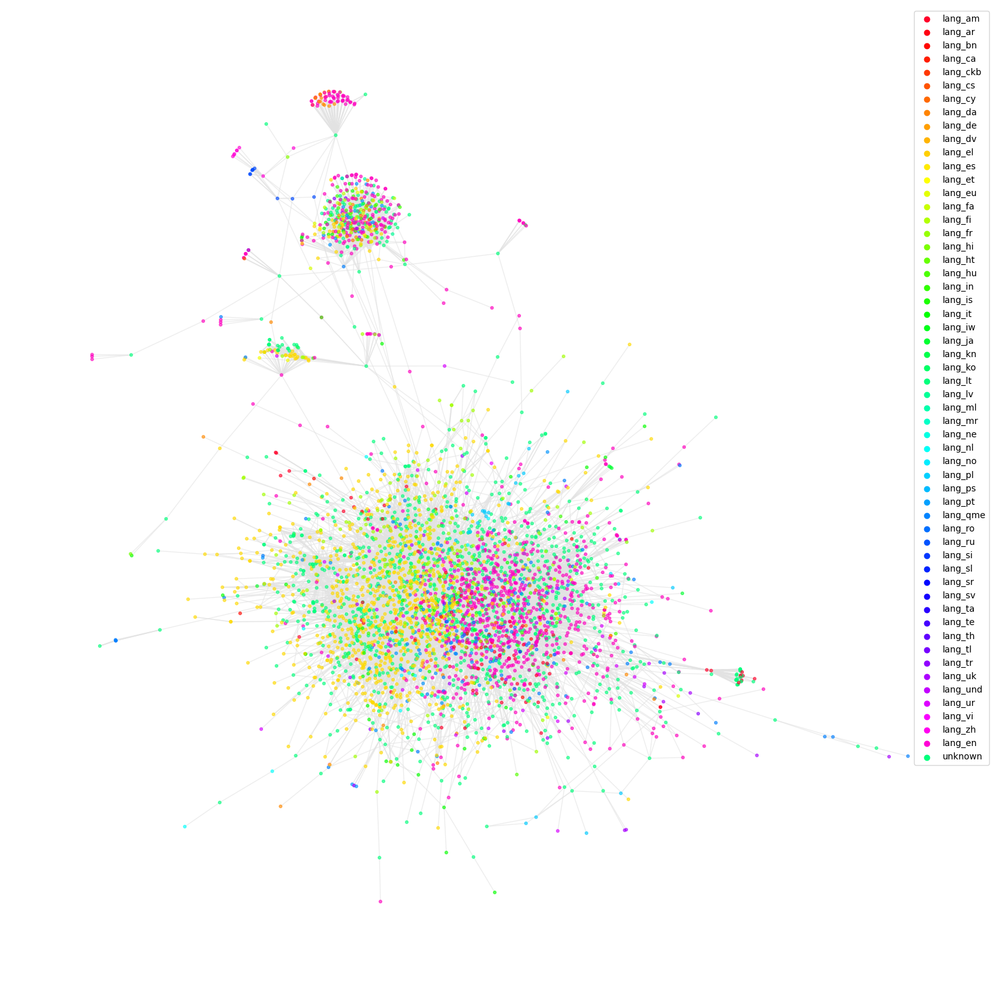

In [51]:
plot_graph(high_degree_graph, lang_colors_eng, color_labels=language_color_dict, 
           filename='language-eng-distiguish-high-degree-graph.png')

### For mentions graph languages

In [128]:
lang_colors_eng_mentions = []

for node in mentions_graph:
    try:
        lang_colors_eng_mentions.append(user_lang_english_discrim[node])
    except KeyError:
        # some of the mentioned users haven't posted a tweet then we still want to keep them but with a diffrent color
        lang_colors_eng_mentions.append(len(languages_list))

In [129]:
Counter(lang_colors_eng_mentions)

Counter({1: 693,
         55: 16069,
         54: 5022,
         12: 19,
         18: 27,
         11: 4179,
         16: 892,
         36: 352,
         50: 272,
         42: 2,
         3: 50,
         14: 29,
         8: 209,
         32: 182,
         6: 13,
         37: 348,
         2: 9,
         22: 300,
         19: 8,
         20: 148,
         34: 137,
         23: 3,
         48: 194,
         43: 3,
         15: 27,
         44: 5,
         5: 12,
         7: 33,
         17: 45,
         26: 24,
         28: 21,
         24: 111,
         13: 12,
         51: 12,
         47: 28,
         53: 10,
         0: 2,
         46: 3,
         33: 6,
         41: 6,
         39: 56,
         27: 2,
         29: 3,
         52: 1,
         38: 4,
         10: 4,
         31: 1,
         30: 4,
         4: 1,
         25: 1,
         49: 1,
         40: 1})

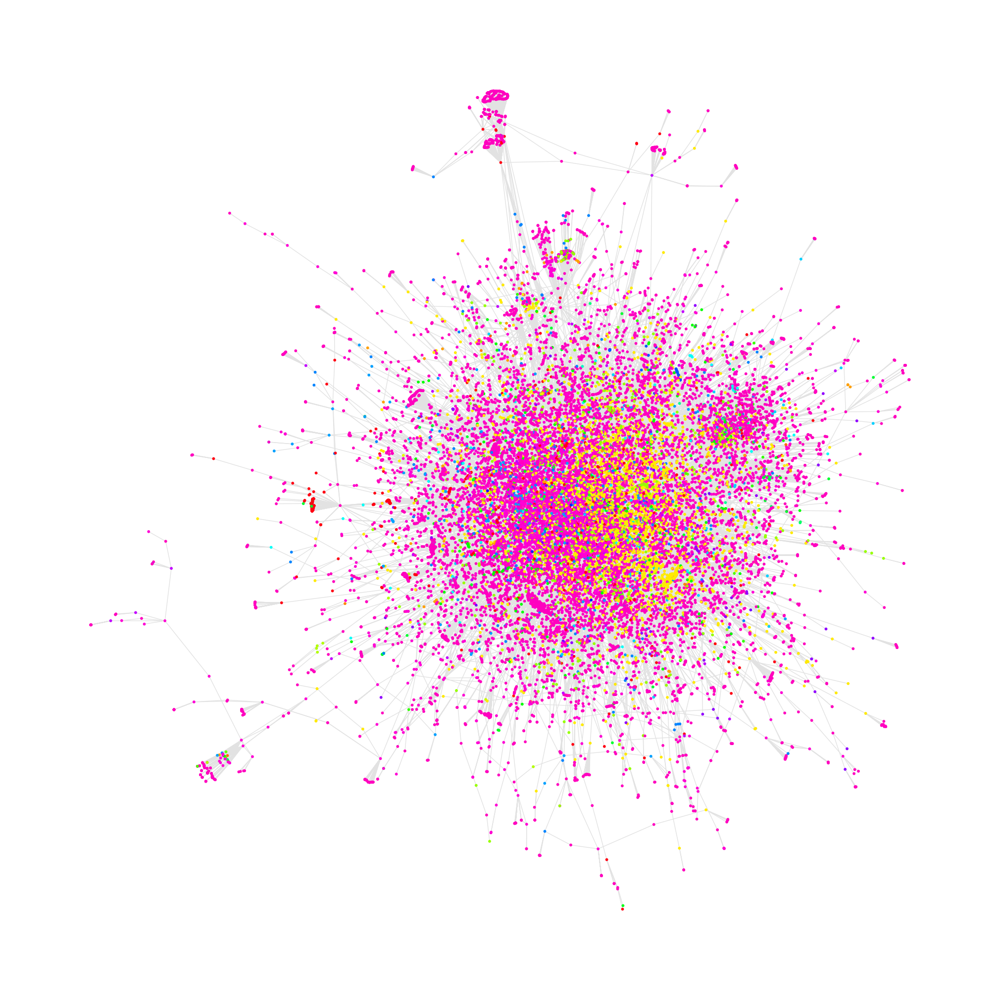

In [130]:
plot_graph(mentions_graph, lang_colors_eng_mentions, 'language-mention-graph.png')

### Iran graphs

In [99]:
df_iran = pd.read_csv('users_iran.csv')
df_iran

,Unnamed: 0,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
0,224,824953105666174976,farshidam6650,2017-01-27 12:12:02+00:00,204,504,36650,False,False
1,227,1590106079769362434,ensaniat3,2022-11-08 22:17:04+00:00,216,788,277,False,False
2,368,1573541591532412928,Elia_irani,2022-09-24 05:15:44+00:00,404,905,1120,False,False
3,369,1012773951477633024,goliiiii5,2018-06-29 19:05:01+00:00,3202,1147,31452,False,False
4,431,3374766449,milad_haghighi,2015-07-13 22:40:13+00:00,133,93,11033,False,False
...,...,...,...,...,...,...,...,...,...
596,423393,710745766827061248,marianmeyer0,2016-03-18 08:32:50+00:00,1627,1463,66735,False,False
597,439513,1537754201358577666,Rii_cck,2022-06-17 11:09:46+00:00,642,2375,3861,False,False
598,441702,48269621,Halmatkurd,2009-06-18 06:30:08+00:00,389,1134,2383,False,False
599,450153,1243394727505850368,yoyo_tit,2020-03-27 04:29:48+00:00,1103,814,1734,False,False


In [100]:
iran_colors = []

for node in high_degree_graph:
    # converting to list since there are two diffrent types here 
    # int type (node)
    # numpy array (df_iran.id) witch contains
    # np.int != int
    if node in list(df_iran.id):
        iran_colors.append(0.1)
    else:
        iran_colors.append(0.9)

In [101]:
iran_colors.count(0.9)

4046

In [102]:
egde_colors = []

for edge in high_degree_graph.edges():
    # if the edge contains iran user
    n_nodes_iran = len(set(iran_subgraph.nodes).intersection(set(edge))) 
    if n_nodes_iran == 1:
        egde_colors.append(plt.cm.Reds(.35))
    elif n_nodes_iran == 2:
        egde_colors.append(plt.cm.Reds(.8))
    else:
        egde_colors.append(plt.cm.Greys(0.1))

NameError: name 'iran_subgraph' is not defined

In [64]:
Counter(egde_colors)

Counter({(0.9538638985005767,
          0.9538638985005767,
          0.9538638985005767,
          1.0): 12267,
         (0.9882352941176471,
          0.6059669357939254,
          0.4853671664744329,
          1.0): 768,
         (0.7364705882352941, 0.08, 0.10117647058823528, 1.0): 31})

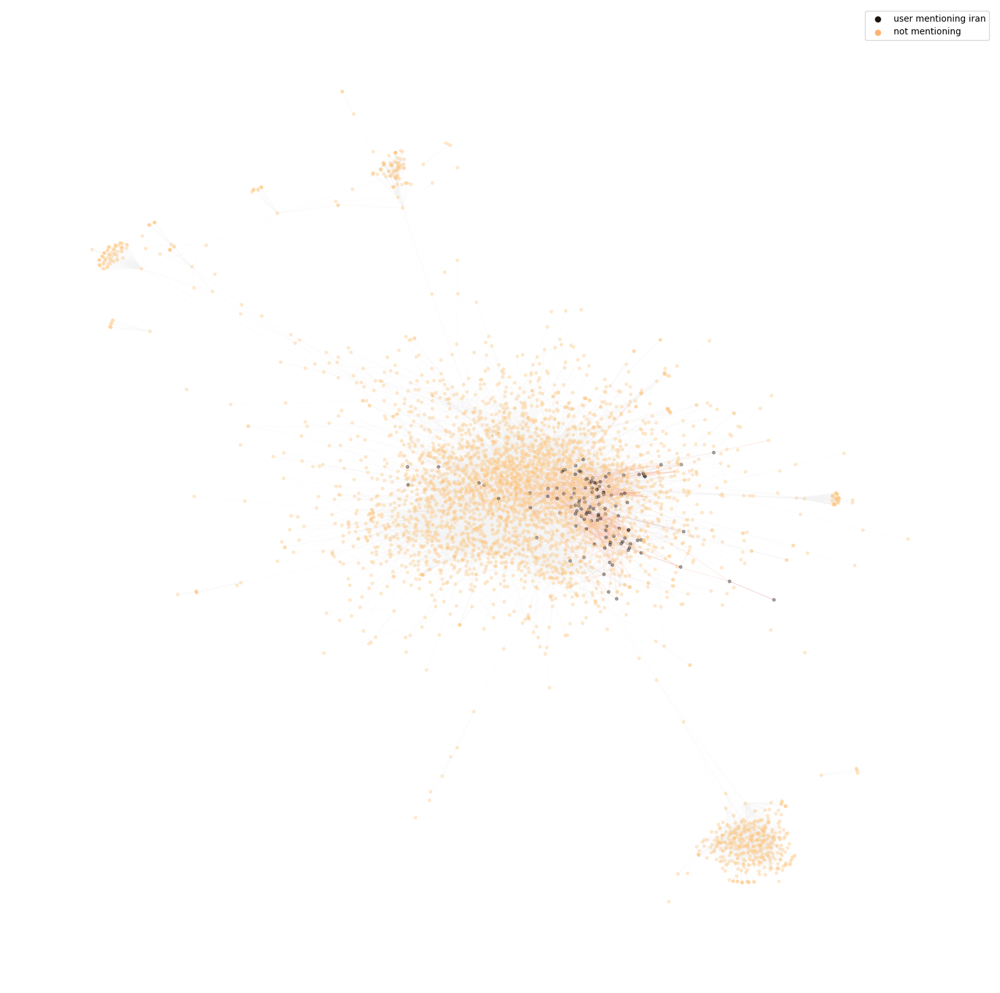

In [65]:
plot_graph(high_degree_graph, iran_colors, color_labels={'user mentioning iran':0.1, 'not mentioning' : 0.9},
           filename='iran-users.png', edge_color=egde_colors, alpha_edges=0.15, alpha_nodes=0.3)

In [103]:
iran_subgraph = high_degree_graph.subgraph(df_iran.id)

In [104]:
iran_extended_subgraph = nx.Graph()

In [105]:
for node in iran_subgraph.nodes:
    neighbors = high_degree_graph.neighbors(node)
    
    for neighbor in neighbors:
        iran_extended_subgraph.add_edge(neighbor, node)

In [106]:
iran_subgraph_colors = [int(node in iran_subgraph.nodes) for node in iran_extended_subgraph.nodes]

In [107]:
Counter(iran_subgraph_colors)

Counter({0: 229, 1: 122})

In [108]:
egde_colors_subgraph = []

for edge in iran_extended_subgraph.edges():
    # if the edge contains iran user
    n_nodes_iran = len(set(iran_subgraph.nodes).intersection(set(edge))) 
    if n_nodes_iran == 1:
        egde_colors_subgraph.append(plt.cm.Reds(.35))
    else:
        egde_colors_subgraph.append(plt.cm.Reds(.8))

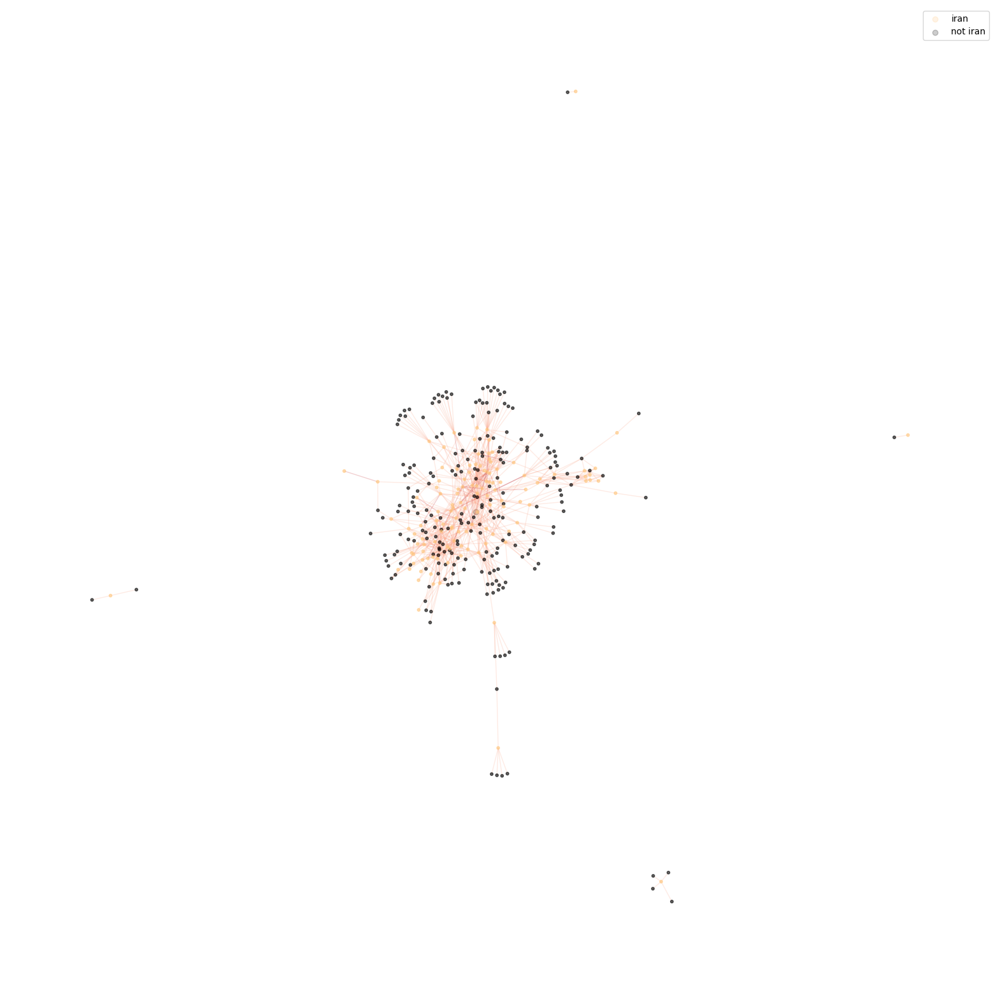

In [109]:
plot_graph(iran_extended_subgraph, iran_subgraph_colors, color_labels={'iran': 1., 'not iran': 0.}, 
           edge_color=egde_colors_subgraph, alpha_edges=0.2)

In [109]:
iran_colors_mentions_graph = []

for node in mentions_graph:
    # converting to list since there are two diffrent types here 
    # int type (node) 
    # numpy array (df_iran.id) witch contains
    # np.int != int
    if node in list(df_iran.id):
        iran_colors_mentions_graph.append(0.1)
    else:
        iran_colors_mentions_graph.append(0.9)

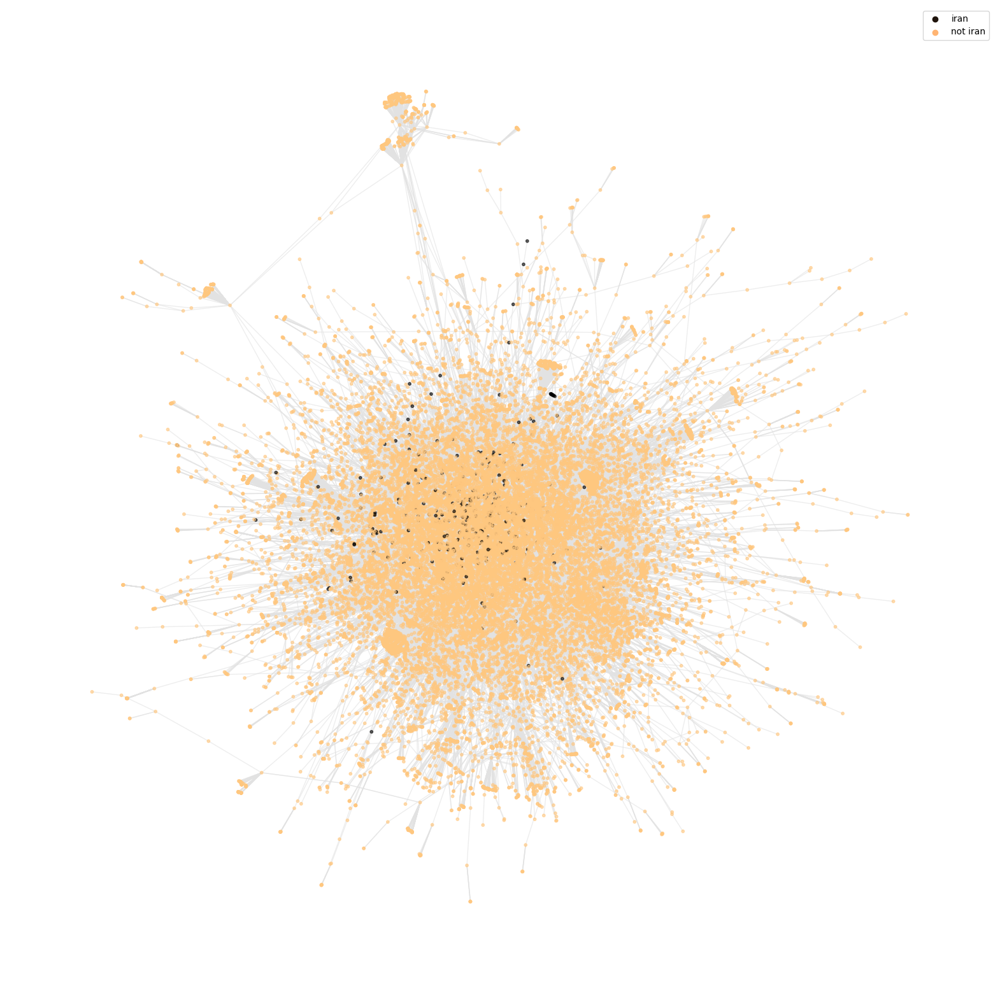

In [197]:
plot_graph(mentions_graph, iran_colors_mentions_graph, filename='iran-users-bigger-graph.png', color_labels={'iran': 0.1, 'not iran': 0.9})

## Graph analisys 
### Looking for corelation in high_degree_graph

In [74]:
high_degree_graph_mentions_df = users[users.id.isin(set(high_degree_graph.nodes))]
high_degree_graph_mentions_df

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
4,1456620452261072896,XavBarretFoot,2021-11-05 13:54:59+00:00,631,205,624,False,False
8,230186918,alam_Newz,2010-12-24 14:51:40+00:00,5117,4018,28124,False,False
9,2429620166,Drkalsulaiti,2014-04-06 00:21:29+00:00,64189,527,20573,False,False
10,353032173,kataraqatar,2011-08-11 13:06:05+00:00,420929,1,59777,False,True
11,704275542648819712,roadto2022en,2016-02-29 12:02:29+00:00,1263911,45,2326,False,True
...,...,...,...,...,...,...,...,...
204415,1300636610548170754,Neodec_,2020-09-01 03:28:51+00:00,939,1135,1921,False,False
204683,2523704433,TestsiteMC,2014-05-02 17:31:40+00:00,361,980,1489,False,False
204734,503748501,Jpereziec,2012-02-26 00:17:04+00:00,365,794,39820,False,False
204887,288970628,augusto_her,2011-04-27 19:43:16+00:00,3213,902,20489,False,False


In [71]:
first_component = list(nx.connected_components(high_degree_graph))[0]
len(first_component)

1075

In [75]:
component_column = []

for author_id in high_dem_graph_mentions_df.id:
    if author_id in first_component:
        component_column.append(1)
    else:
        component_column.append(0)

component_column

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [119]:
high_degree_graph_mentions_df.loc[:,'component'] = component_column

C:\Users\jjasi\AppData\Local\Temp\ipykernel_2348\122778987.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_degree_graph_mentions_df.loc[:,'component'] = component_column


In [122]:
high_degree_graph_mentions_df[high_degree_graph_mentions_df.component == 0]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified,component
634,779652781397291009,ChaifullyYours,2016-09-24 12:04:43+00:00,1754,12,872,False,False,0
1690,971403215919988736,Sneeha_,2018-03-07 15:12:29+00:00,654,2071,71195,False,False,0
1941,1271828392430702594,PrakCryptoholic,2020-06-13 15:35:17+00:00,182,755,23157,False,False,0
1942,1482341697627561988,TheApiens,2022-01-15 13:19:57+00:00,147557,234,1051,False,True,0
2142,844145637788651520,dasarathi37,2017-03-21 11:16:18+00:00,132,1124,3926,False,False,0
...,...,...,...,...,...,...,...,...,...
145055,745614139,JiteshZaveri,2012-08-08 17:32:37+00:00,339,4545,6586,False,False,0
152765,65327712,milvib,2009-08-13 09:43:18+00:00,430,2191,6392,False,False,0
160205,1344669379158368257,khushi_techie,2020-12-31 15:39:14+00:00,113,471,4328,False,False,0
160470,124517092,nekkantitsayz,2010-03-19 17:11:57+00:00,995,4802,163547,False,False,0


### Community detection on high_degree_graph

In [110]:
def get_colors_for_communities(communities, graph):
    color_dict = {}

    color = 0.0
    for community in communities:
        for node in community:
            color_dict[node] = color
        color += 1/len(communities)
        
    color_list = []

    for node in graph.nodes():
        color_list.append(color_dict[node])
        
    return color_list

In [111]:
c = greedy_modularity_communities(high_degree_graph, resolution=0.05)

In [112]:
len(c)

3

In [113]:
modularity(high_degree_graph, c)

0.2887531349805761

In [114]:
communities_colors = get_colors_for_communities(c, high_degree_graph)

In [115]:
set(communities_colors)

{0.0, 0.3333333333333333, 0.6666666666666666}

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


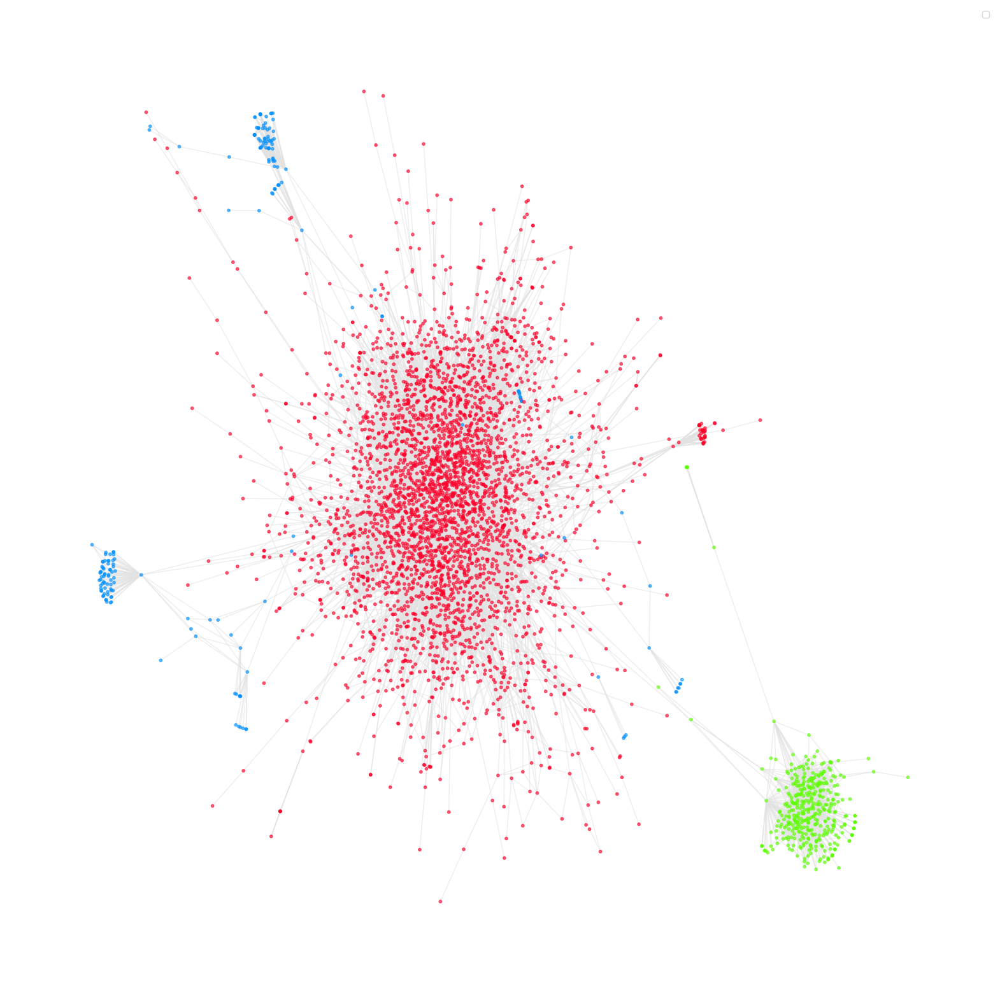

In [116]:
plot_graph(high_degree_graph, communities_colors, 'communities-4-without-bots-colors.png')

## Analysis of detected communities

In [44]:
users_used_in_graph = users[users.id.isin(high_degree_graph.nodes)]
users_used_in_graph

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
4,1456620452261072896,XavBarretFoot,2021-11-05 13:54:59+00:00,631,205,624,False,False
8,230186918,alam_Newz,2010-12-24 14:51:40+00:00,5117,4018,28124,False,False
9,2429620166,Drkalsulaiti,2014-04-06 00:21:29+00:00,64189,527,20573,False,False
10,353032173,kataraqatar,2011-08-11 13:06:05+00:00,420929,1,59777,False,True
11,704275542648819712,roadto2022en,2016-02-29 12:02:29+00:00,1263911,45,2326,False,True
...,...,...,...,...,...,...,...,...
142120,129898028,apaniaguad,2010-04-05 18:57:29+00:00,146,465,4747,False,False
142331,3913279820,Da18181510,2015-10-16 11:30:46+00:00,196,195,62000,False,False
142364,208651278,AdrianbarrosJP,2010-10-27 17:26:35+00:00,89661,90212,73237,False,False
142390,108368921,MASDYNAMO,2010-01-25 18:39:22+00:00,301,1424,7230,False,False


In [49]:
node_to_community = {}

for community_number, community in enumerate(c):
    for node in community:
        node_to_community[node] = community_number

Counter(node_to_community.values())

Counter({0: 3577, 1: 393, 2: 198})

In [57]:
community_column = users_used_in_graph.id.apply(lambda user_id: node_to_community[user_id])

In [58]:
users_used_in_graph['community_number'] = community_column

C:\Users\jjasi\AppData\Local\Temp\ipykernel_20628\3210924098.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users_used_in_graph['community_number'] = community_column


In [61]:
users_used_in_graph.to_csv('users-with-communities.csv', index=False)

In [52]:
users_used_in_graph[users_used_in_graph[community_number] == 0]

KeyError: 2

In [80]:
for community in c:
    print(community)

frozenset({1189582232895348736, 1016198241417822208, 1072171637557075968, 1584143056198041600, 960840060869468160, 794637046899965953, 928683542904700928, 1555630306899755008, 1415527126162448384, 1299307422528479232, 1060758862867898369, 1495524800118333444, 846899281806082053, 1587116515513491464, 1515800749367869447, 138362887, 1389708352922476558, 1471876542317871113, 1412751373, 1489298687138349071, 64798737, 1449743431027154960, 1579942353699217424, 1412210707, 305389589, 1433741651265085463, 268361752, 1307573563931742208, 591085596, 3301081117, 118292510, 1464250575931981854, 26640415, 21823527, 1582063657, 43294762, 97050667, 143843372, 849552021355200513, 364191792, 1206026292, 755556408, 20013113, 338985020, 491462717, 832766016, 213819459, 127688772, 778674288819900416, 1573211031106686976, 1326817814271954944, 1547115670755807232, 2834511, 41926743, 165699676, 1497585518497959937, 101695592, 182501483, 130973804, 1336279154, 604282994, 68051064, 24969337, 572227707, 229555

In [85]:
highest_degree_for_com = {}

for i, community in enumerate(c):
    degrees = high_degree_graph.degree(community)
    
    max_degree = 1
    
    for node, degree in degrees:
        if degree > max_degree:
            max_degree = degree
            higest_degree_node = node
    
    print(f"Community {i} max_degree: {max_degree} node: {node}")
    highest_degree_for_com[community] = higest_degree_node

Community: 0 max_degree: 530 node: 95002621
Community: 1 max_degree: 197 node: 3001390075
Community: 2 max_degree: 68 node: 1581658598895222785


In [84]:
highest_degree_nodes = list(highest_degree_for_com.values())

dict_values([138372303, 794896953314131969, 460537897])

In [87]:
users[users.id == 138372303]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
15,138372303,FIFAWorldCup,2010-04-29 10:58:07+00:00,10058244,589,29572,False,True


In [88]:
users[users.id == 794896953314131969]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
25634,794896953314131969,a23_fantasy,2016-11-05 13:39:36+00:00,4753,212,4261,False,False


In [89]:
users[users.id == 460537897]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
21899,460537897,coinexcom,2012-01-10 21:31:37+00:00,241900,727,5372,False,True


In [120]:
tweets[tweets['author_id'] == 460537897]

,hashtag,id,author_id,text,like_count,reply_count,retweet_count,quote_count,created_at,lang,mentions


In [132]:
tweets[tweets['author_id'].isin(c[1])].describe()

,id,author_id,like_count,reply_count,retweet_count,quote_count
count,1.608000e+03,1.608000e+03,1608.000000,1608.000000,1608.000000,1608.000000
mean,1.597432e+18,8.645397e+17,1.677239,0.873756,0.777985,0.079602
std,1.823169e+15,5.878493e+17,7.770090,6.740979,5.486519,0.638824
min,1.594577e+18,5.728324e+07,0.000000,0.000000,0.000000,0.000000
25%,1.595992e+18,3.001390e+09,0.000000,0.000000,0.000000,0.000000
50%,1.597244e+18,1.113367e+18,0.000000,0.000000,0.000000,0.000000
75%,1.598301e+18,1.338411e+18,1.000000,0.000000,0.000000,0.000000
max,1.605537e+18,1.565037e+18,107.000000,76.000000,60.000000,8.000000


In [134]:
tweets[tweets['author_id'].isin(c[2])].describe()

,id,author_id,like_count,reply_count,retweet_count,quote_count
count,2.940000e+02,2.940000e+02,294.000000,294.000000,294.000000,294.000000
mean,1.598179e+18,1.089272e+18,1.367347,1.132653,1.054422,0.091837
std,1.072697e+15,5.324359e+17,12.060474,11.513136,11.139685,1.314815
min,1.595767e+18,2.171448e+08,0.000000,0.000000,0.000000,0.000000
25%,1.597902e+18,9.928172e+17,0.000000,0.000000,0.000000,0.000000
50%,1.598262e+18,1.309284e+18,0.000000,0.000000,0.000000,0.000000
75%,1.599083e+18,1.439936e+18,0.000000,0.000000,0.000000,0.000000
max,1.599750e+18,1.575798e+18,171.000000,163.000000,159.000000,22.000000


In [127]:
users[users.id.isin(c[1])].head(50)

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
585,167331700,pradeep8558,2010-07-16 09:10:07+00:00,530,3012,12839,False,False
586,779652781397291009,ChaifullyYours,2016-09-24 12:04:43+00:00,1754,12,872,False,False
1415,971403215919988736,Sneeha_,2018-03-07 15:12:29+00:00,654,2071,71195,False,False
1807,627785862,ujjawalkumar26,2012-07-05 20:25:40+00:00,970,2055,65078,False,False
1808,1282806486,Gayathrimohan_,2013-03-20 09:35:32+00:00,1957,1178,39775,False,False
1809,588338703,coolkishore59,2012-05-23 12:40:40+00:00,530,2018,47500,False,False
1810,1118795691789127680,Deepaadhan3,2019-04-18 08:37:33+00:00,2348,3104,62781,False,False
2494,1535845702089474048,msricky86,2022-06-12 04:45:35+00:00,27,807,8148,False,False
2495,1529000363159740417,SmartAnand07,2022-05-24 07:28:10+00:00,559,2892,19304,False,False
2496,893111254159687680,Lazycrrow,2017-08-03 14:08:11+00:00,2050,839,27853,False,False


#### Community detection on mentions_graph

In [198]:
c_mentions = greedy_modularity_communities(mentions_graph, resolution=0.01)
len(c_mentions)

5

In [199]:
modularity(mentions_graph, c_mentions)

0.19278609221742699

In [200]:
mention_com_colors = get_colors_for_communities(c_mentions, mentions_graph)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


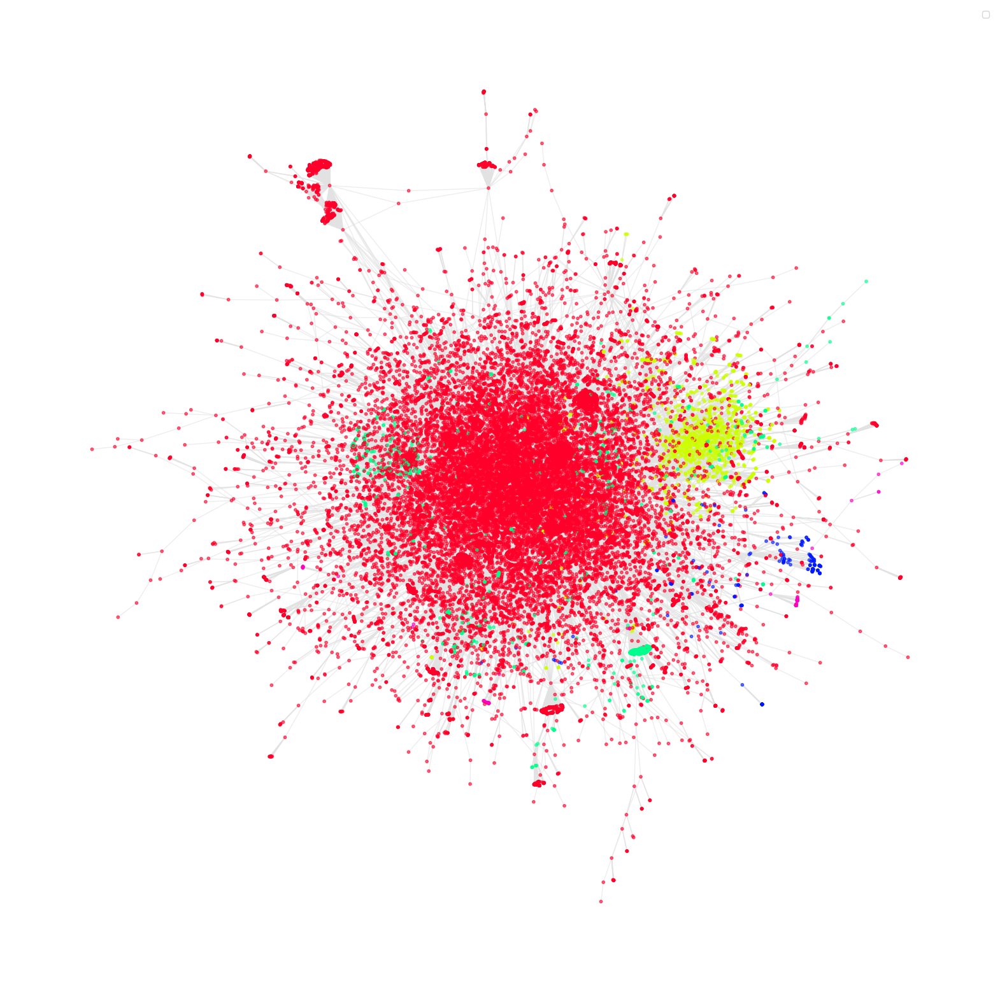

In [201]:
plot_graph(mentions_graph, mention_com_colors, "communities_mention_graph.png")

### Graphs with BOTs

In [141]:
raw_undirected_with_bots = nx.Graph()

In [142]:
for _, row in mentions_df_raw.iterrows():
    mention_ids = list_capture(row['mentions'])
    
    for mention_id in mention_ids:
        raw_undirected_with_bots.add_edge(row['author_id'], mention_id)

In [143]:
raw_undirected_with_bots.remove_edges_from(nx.selfloop_edges(raw_undirected_with_bots))

In [144]:
raw_undirected_with_bots.size(), len(raw_undirected_with_bots.nodes())

(81744, 60360)

In [145]:
for component in list(nx.connected_components(raw_undirected_with_bots)):
    if len(component) < 1500:
        for node in component:
            raw_undirected_with_bots.remove_node(node)

In [146]:
raw_undirected_with_bots.size(), len(raw_undirected_with_bots.nodes())

(71833, 46042)

In [149]:
low_degree_nodes_bots = [node for node,degree in dict(raw_undirected_with_bots.degree()).items() if degree <= 2]
len(low_degree_nodes_bots)

35710

In [150]:
raw_undirected_with_bots.remove_nodes_from(low_degree_nodes_bots)

In [151]:
raw_undirected_with_bots.size(), len(raw_undirected_with_bots.nodes())

(30685, 10332)

In [152]:
for component in list(nx.connected_components(raw_undirected_with_bots)):
    if len(component) < 15:
        for node in component:
            raw_undirected_with_bots.remove_node(node)

In [153]:
raw_undirected_with_bots.size(), len(raw_undirected_with_bots.nodes())

(30622, 10039)

In [155]:
bot_colors = []

for node in raw_undirected_with_bots.nodes():
    if node in list(bot_users.id):
        bot_colors.append(0.)
    else:
        bot_colors.append(1.)

In [156]:
bot_colors.count(0.), bot_colors.count(1.)

(2557, 7482)

In [157]:
raw_undirected_with_bots.remove_edges_from(nx.selfloop_edges(raw_undirected_with_bots))

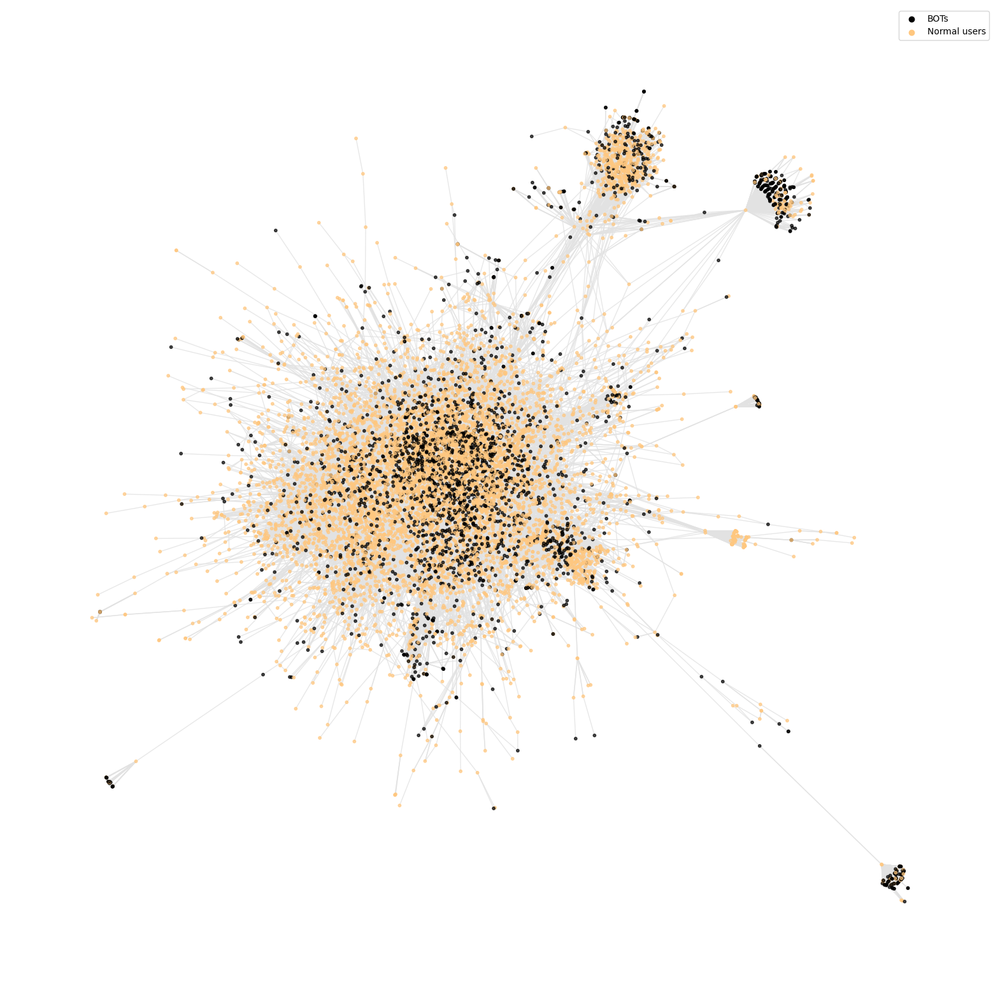

In [158]:
plot_graph(raw_undirected_with_bots, bot_colors, 'raw-undirexted-with-bots-colored.png', 
           color_labels={'BOTs': 0., 'Normal users': 1.})

In [161]:
c_bots = greedy_modularity_communities(raw_undirected_with_bots, resolution=0.03)

In [162]:
len(c_bots)

5

In [163]:
modularity(raw_undirected_with_bots, c_bots)

0.2125407389032242

In [164]:
col_bots = get_colors_for_communities(c_bots, raw_undirected_with_bots)
col_bots

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


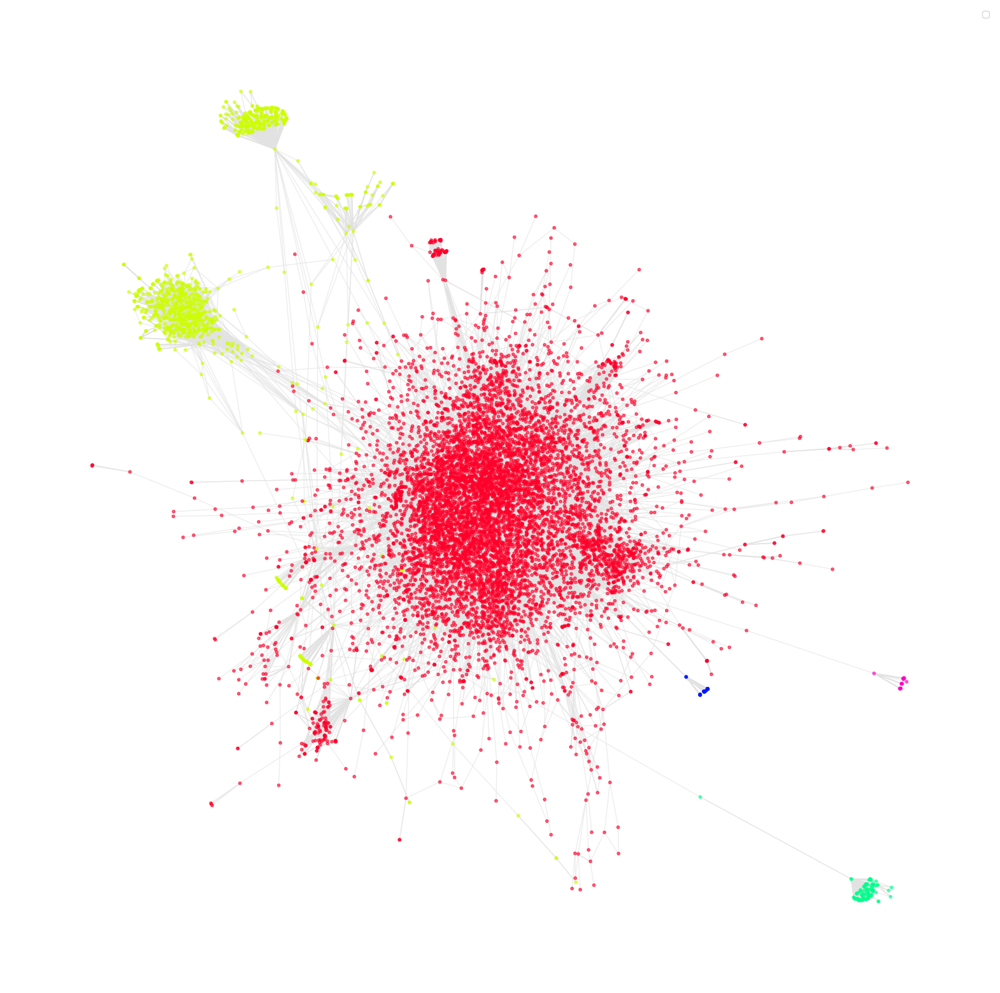

In [165]:
plot_graph(raw_undirected_with_bots, col_bots, 'communities-5-mentions-graph-BEST.png')

## Directed graphs

### Without BOTs

In [93]:
raw_directed = nx.DiGraph()

In [94]:
for _, row in mentions_df.iterrows():
    mention_ids = list_capture(row['mentions'])
    
    for mention_id in mention_ids:
        raw_directed.add_edge(row['author_id'], mention_id)

In [95]:
dir_mentions_graph = raw_directed.copy()

In [96]:
for component in list(nx.weakly_connected_components(dir_mentions_graph)):
    if len(component) < 1000:
        for node in component:
            dir_mentions_graph.remove_node(node)

In [97]:
dir_mentions_graph.size()

44423

In [98]:
len(dir_mentions_graph.nodes)

29596

In [99]:
dir_mentions_graph.remove_edges_from(nx.selfloop_edges(dir_mentions_graph))

In [100]:
dir_low_degree_nodes = [node for node,degree in dict(dir_mentions_graph.degree()).items() if degree <= 5]
len(dir_low_degree_nodes)

27069

In [101]:
dir_mentions_graph.remove_nodes_from(dir_low_degree_nodes)

In [102]:
for component in list(nx.weakly_connected_components(dir_mentions_graph)):
    if len(component) < 15:
        for node in component:
            dir_mentions_graph.remove_node(node)

In [109]:
c = greedy_modularity_communities(dir_mentions_graph, resolution=0.04)

In [110]:
len(c)

4

In [111]:
modularity(dir_mentions_graph, c)

0.37828173919536623

In [106]:
dir_mention_colors = get_colors_for_communities(c, dir_mentions_graph)

In [107]:
set(dir_mention_colors)

{0.0, 0.2, 0.4, 0.6000000000000001, 0.8}

In [108]:
plot_graph(dir_mentions_graph, dir_mention_colors)

KeyboardInterrupt: 

<Figure size 2000x2000 with 0 Axes>

In [ ]:
highest_degree_for_com = {}

for i, community in enumerate(c):
    
    max_degree = 1
    
    for node in community:
        n_edges_in = len(dir_mentions_graph.in_edges(node))
        
        if n_edges_in > max_degree:
            max_degree=n_edges_in
            higest_degree_node = node
    
    
    print(f"Community: {i} max_degree: {max_degree} node: {node}")
    highest_degree_for_com[community] = higest_degree_node

### With BOTs

In [27]:
raw_directed_with_bots = nx.DiGraph()

In [28]:
for _, row in mentions_df_raw.iterrows():
    mention_ids = list_capture(row['mentions'])
    
    for mention_id in mention_ids:
        raw_directed_with_bots.add_edge(row['author_id'], mention_id)

In [29]:
dir_mentions_graph_bots = raw_directed_with_bots.copy()

In [30]:
for component in list(nx.weakly_connected_components(dir_mentions_graph_bots)):
    if len(component) < 1000:
        for node in component:
            dir_mentions_graph_bots.remove_node(node)

In [31]:
dir_mentions_graph_bots.size()

72507

In [32]:
len(dir_mentions_graph_bots.nodes)

46042

In [35]:
dir_mentions_graph_bots.remove_edges_from(nx.selfloop_edges(dir_mentions_graph_bots))

In [36]:
dir_low_degree_nodes = [node for node,degree in dict(dir_mentions_graph_bots.degree()).items() if degree <= 5]
len(dir_low_degree_nodes)

41994

In [37]:
dir_mentions_graph_bots.remove_nodes_from(dir_low_degree_nodes)

In [38]:
for component in list(nx.weakly_connected_components(dir_mentions_graph_bots)):
    if len(component) < 15:
        for node in component:
            dir_mentions_graph_bots.remove_node(node)

## Bot colored graph

In [190]:
bot_colors = []

for node in dir_mentions_graph_bots:
    if node in list(bot_users.id):
        bot_colors.append(0.)
    else:
        bot_colors.append(1.)

In [192]:
Counter(bot_colors)

Counter({1.0: 2905, 0.0: 895})

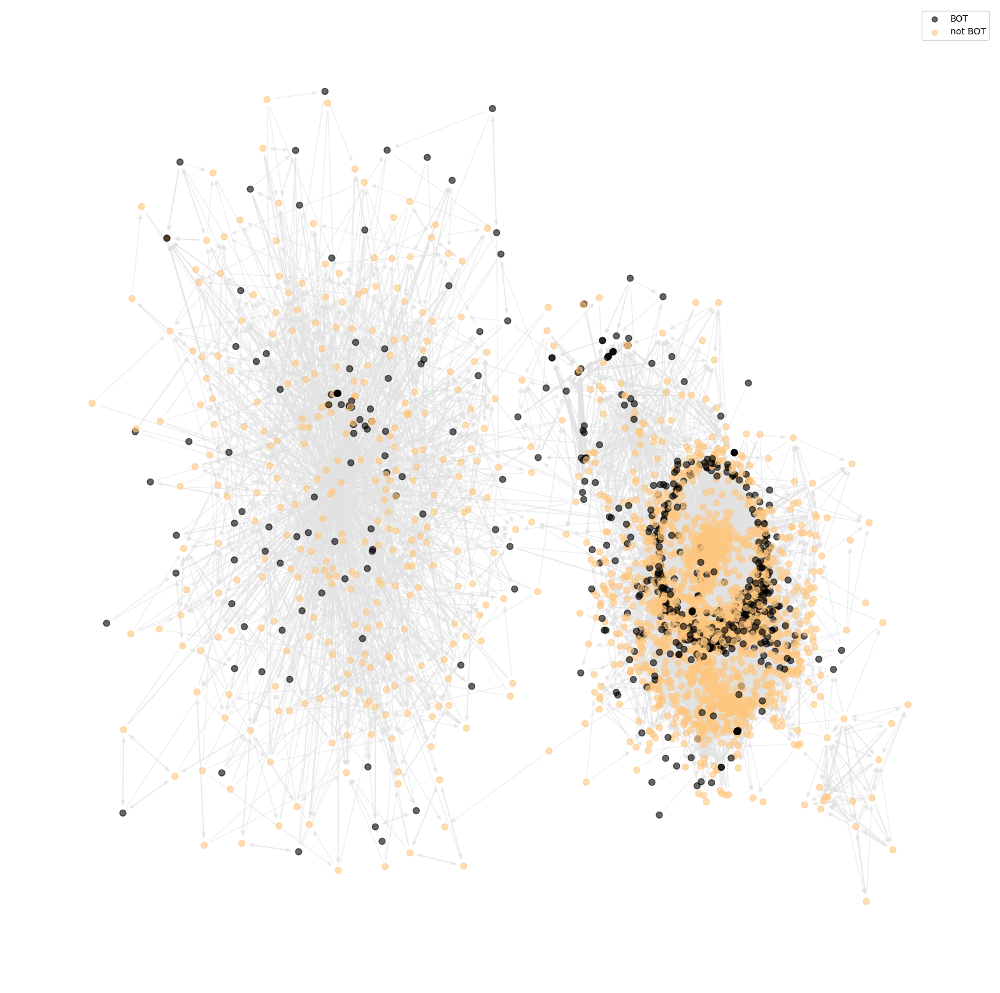

In [213]:
plot_graph(dir_mentions_graph_bots, bot_colors, 
           color_labels={'BOT': 0.0, 'not BOT': 1.0}, filename='directed-bot-users-colored.png')

## Modularity detection

In [216]:
c = greedy_modularity_communities(dir_mentions_graph_bots, resolution=0.04)

In [217]:
len(c)

4

In [58]:
modularity(dir_mentions_graph_bots, c)

0.3149188011999334

In [76]:
dir_mention_colors = get_colors_for_communities(c, dir_mentions_graph_bots)

In [77]:
set(dir_mention_colors)

{0.0, 0.25, 0.5, 0.75}

In [62]:
most_mentioned_for_community = {}

for community_number, community in enumerate(c):
    degrees_in = dir_mentions_graph_bots.in_degree(community)
    
    max_degree = 1
    
    for node, degree in degrees_in:
        if degree > max_degree:
            max_degree = degree
            higest_degree_node = node
            
    most_mentioned_for_community[community_number] = higest_degree_node

In [68]:
users[users.id.isin(most_mentioned_for_community.values())]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
15,138372303,FIFAWorldCup,2010-04-29 10:58:07+00:00,10058244,589,29572,False,True
22957,1553382185301843974,CryptoSportsHub,2022-07-30 14:09:20+00:00,775,28,306,False,False
25634,794896953314131969,a23_fantasy,2016-11-05 13:39:36+00:00,4753,212,4261,False,False
75602,1539887116792250369,M3taCup,2022-06-23 08:25:00+00:00,112,3,12,False,False


In [69]:
most_often_mentioning_for_community = {}

for community_number, community in enumerate(c):
    degrees_out = dir_mentions_graph_bots.out_degree(community)
    
    max_degree = 1
    
    for node, degree in degrees_out:
        if degree > max_degree:
            max_degree = degree
            higest_degree_node = node
            
    most_often_mentioning_for_community[community_number] = higest_degree_node

In [71]:
users[users.id.isin(most_often_mentioning_for_community.values())]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
2495,1529000363159740417,SmartAnand07,2022-05-24 07:28:10+00:00,559,2892,19304,False,False
3737,163892413,dejiplus,2010-07-07 14:49:54+00:00,493,16,252207,False,False
24474,524510306,timoscholar,2012-03-14 16:36:10+00:00,443,2497,7787,False,False
75738,1392606838609354758,YvesRol99732549,2021-05-12 22:25:39+00:00,9,146,149,False,False


In [119]:
Counter(dir_mention_colors)

Counter({0.0: 3169, 0.25: 416, 0.5: 158, 0.75: 57})

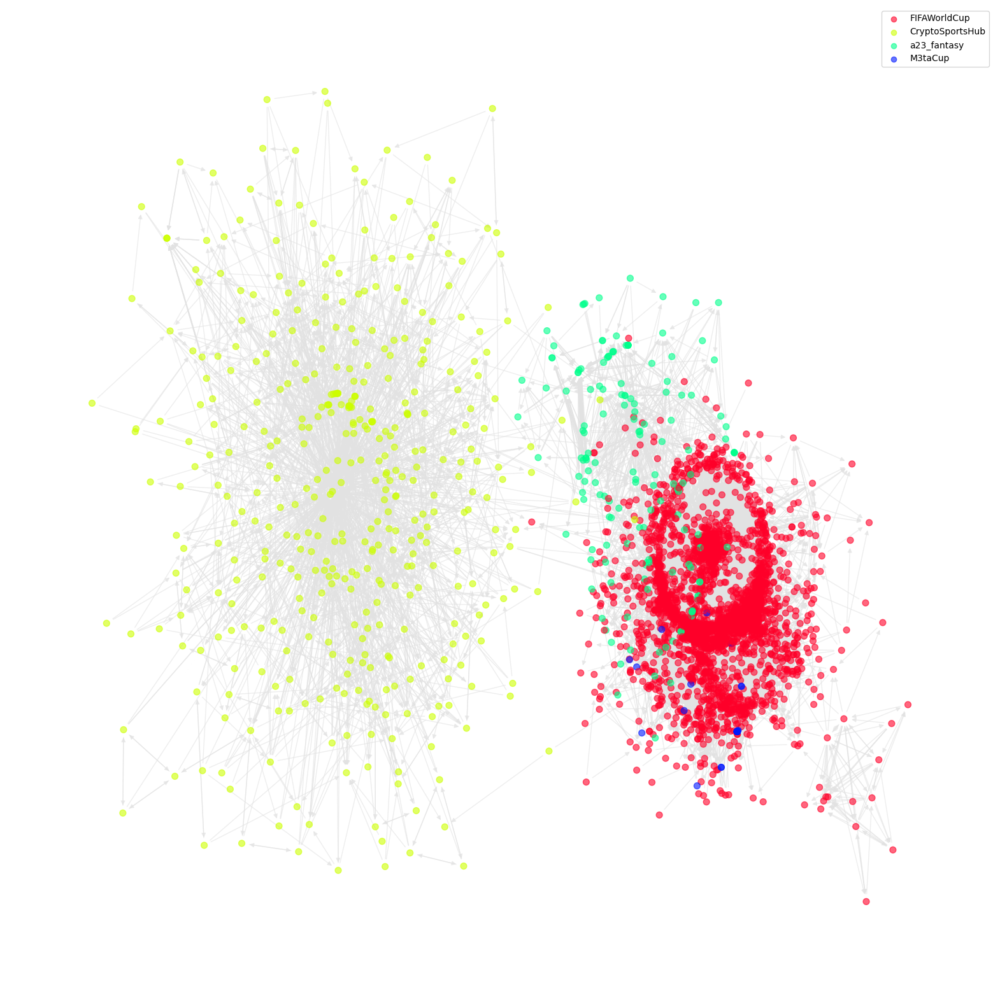

In [212]:
plot_graph(dir_mentions_graph_bots, dir_mention_colors, filename='directed-with-bots-spring.png', 
           color_labels={'FIFAWorldCup': 0.0, 'CryptoSportsHub': 0.25, 'a23_fantasy': 0.5, 'M3taCup': 0.75})

In [218]:
node_to_community = {}

for community_number, community in enumerate(c):
    for node in community:
        node_to_community[node] = community_number

In [219]:
Counter(node_to_community.values())

Counter({0: 3169, 1: 416, 2: 158, 3: 57})

In [222]:
users_used_in_graph = users[users.id.isin(dir_mentions_graph_bots.nodes)]

In [223]:
community_column = users_used_in_graph.id.apply(lambda user_id: node_to_community[user_id])

In [224]:
users_used_in_graph['community_number'] = community_column

C:\Users\jjasi\AppData\Local\Temp\ipykernel_9952\3210924098.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users_used_in_graph['community_number'] = community_column


In [225]:
users_used_in_graph

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified,community_number
8,230186918,alam_Newz,2010-12-24 14:51:40+00:00,5117,4018,28124,False,False,0
9,2429620166,Drkalsulaiti,2014-04-06 00:21:29+00:00,64189,527,20573,False,False,0
10,353032173,kataraqatar,2011-08-11 13:06:05+00:00,420929,1,59777,False,True,0
11,704275542648819712,roadto2022en,2016-02-29 12:02:29+00:00,1263911,45,2326,False,True,0
12,1567884749498204160,Roadto2022Go,2022-09-08 14:38:09+00:00,25706,50,225,False,True,0
...,...,...,...,...,...,...,...,...,...
142009,43659869,geonal,2009-05-31 07:49:39+00:00,1355,57,54667,False,False,0
142024,562696991,chanchal711,2012-04-25 08:15:48+00:00,72,54,434,False,False,0
142364,208651278,AdrianbarrosJP,2010-10-27 17:26:35+00:00,89661,90212,73237,False,False,0
142390,108368921,MASDYNAMO,2010-01-25 18:39:22+00:00,301,1424,7230,False,False,0


In [243]:
users_used_in_graph.to_csv('users-with-communities.csv', index=False)

## Centrality

### For each community

In [227]:
community_centrality = {}

for community_number, community in enumerate(c):
    community_subgraph = dir_mentions_graph_bots.subgraph(community)
    
    betweenness_cent = nx.betweenness_centrality(community_subgraph)
    betweenness_cent_sorted = dict(sorted(betweenness_cent.items(), key=lambda item: item[1]))
    top_5_betweenes_centrality= list(betweenness_cent_sorted.keys())[:5]
    community_centrality[community_number] = top_5_betweenes_centrality

In [240]:
users[users.id.isin(community_centrality[0])]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
8,230186918,alam_Newz,2010-12-24 14:51:40+00:00,5117,4018,28124,False,False
9,2429620166,Drkalsulaiti,2014-04-06 00:21:29+00:00,64189,527,20573,False,False
12,1567884749498204160,Roadto2022Go,2022-09-08 14:38:09+00:00,25706,50,225,False,True
14,73991669,roadto2022,2009-09-13 22:35:59+00:00,1170017,161,12399,False,True
25,745524289,alekhbariyh,2012-08-08 16:37:23+00:00,6518,4416,57850,False,False


In [241]:
tweets[tweets.author_id.isin(community_centrality[0])]

,hashtag,id,author_id,text,like_count,reply_count,retweet_count,quote_count,created_at,lang,mentions
12,#Qatar2022,1592601122879197185,230186918,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:31:11+00:00,ar,"['2429620166', '353032173', '70427554264881971..."
18,#Qatar2022,1592601049428549632,745524289,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:30:53+00:00,ar,"['2429620166', '353032173', '70427554264881971..."


In [244]:
community_centrality = {}

for community_number, community in enumerate(c):
    community_subgraph = dir_mentions_graph_bots.subgraph(community)
    
    closeness_cent = nx.closeness_centrality(community_subgraph)
    closeness_cent_sorted = dict(sorted(closeness_cent.items(), key=lambda item: item[1]))
    top_5_closeness_cent= list(closeness_cent_sorted.keys())[:5]
    community_centrality[community_number] = top_5_closeness_cent

In [246]:
community_centrality

{0: [230186918, 745524289, 1219851875408846848, 266652243, 4641084214],
 1: [1574595611739168768,
  1594199257720016897,
  1271828392430702594,
  1331044355516239872,
  1253642676886331392],
 2: [1578081468827324416,
  1597116955625930754,
  1317816322298871808,
  1589591811638468609,
  935459968630902784],
 3: [1554137898777456640,
  1441925223637401604,
  1465356052887531520,
  1445904541040328704,
  1476809112981688322]}

In [247]:
users[users.id.isin(community_centrality[1])]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
1623,1271828392430702594,PrakCryptoholic,2020-06-13 15:35:17+00:00,182,755,23157,False,False
27608,1331044355516239872,Sunny34212,2020-11-24 01:18:11+00:00,45,428,4518,False,False
34331,1594199257720016897,Ayanokoji75,2022-11-20 05:21:46+00:00,7,50,28,False,False
35032,1253642676886331392,PAVAN_BN_,2020-04-24 11:11:35+00:00,60,318,13659,False,False
99349,1574595611739168768,varshamewada13,2022-09-27 03:04:02+00:00,3,29,34,False,False


In [251]:
tweets[tweets.author_id.isin(community_centrality[3])]

,hashtag,id,author_id,text,like_count,reply_count,retweet_count,quote_count,created_at,lang,mentions
203779,#Qatar2022,1598283346886656002,1554137898777456640,@NFT11_Official @M3taCup @HiNguynng9 @danghai6...,0,0,0,0,2022-12-01 11:50:19+00:00,it,"['1402218366648012806', '1539887116792250369',..."
208315,#Qatar2022,1598234519521619969,1441925223637401604,@NFT11_Official @M3taCup DONE TO JOIN PLATFORM...,0,0,0,0,2022-12-01 08:36:17+00:00,en,"['1402218366648012806', '1539887116792250369',..."
208841,#Qatar2022,1598226831744077825,1445904541040328704,@NFT11_Official @M3taCup Success for your Team...,0,0,0,0,2022-12-01 08:05:44+00:00,en,"['1402218366648012806', '1539887116792250369',..."
211283,#Qatar2022,1598191116054327296,1476809112981688322,@NFT11_Official @M3taCup Super Platform \n@Joh...,0,0,0,0,2022-12-01 05:43:49+00:00,de,"['1402218366648012806', '1539887116792250369',..."
215020,#Qatar2022,1598137557195583488,1465356052887531520,@NFT11_Official @M3taCup Allredy done sir\n@Fa...,1,0,0,0,2022-12-01 02:11:00+00:00,en,"['1402218366648012806', '1539887116792250369',..."


### Whole graph

In [74]:
betweenness_centrality = nx.betweenness_centrality(dir_mentions_graph_bots)
betweenness_centrality_sorted = dict(sorted(betweenness_centrality.items(), key=lambda item: item[1]))
top_10_betweenes_centrality= list(betweenness_centrality_sorted.keys())[:10]
top_10_betweenes_centrality

[230186918,
 2429620166,
 1567884749498204160,
 73991669,
 745524289,
 1219851875408846848,
 266652243,
 18936161,
 1131208134977032193,
 4641084214]

In [75]:
users[users.id.isin(top_10_betweenes_centrality)]

,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
8,230186918,alam_Newz,2010-12-24 14:51:40+00:00,5117,4018,28124,False,False
9,2429620166,Drkalsulaiti,2014-04-06 00:21:29+00:00,64189,527,20573,False,False
12,1567884749498204160,Roadto2022Go,2022-09-08 14:38:09+00:00,25706,50,225,False,True
14,73991669,roadto2022,2009-09-13 22:35:59+00:00,1170017,161,12399,False,True
25,745524289,alekhbariyh,2012-08-08 16:37:23+00:00,6518,4416,57850,False,False
32,1219851875408846848,SCUD_PREES,2020-01-22 05:19:08+00:00,606,1546,3187,False,False
35,266652243,alafqkw,2011-03-15 15:40:05+00:00,17280,11,12509,False,False
42,18936161,lequipe,2009-01-13 12:08:23+00:00,6370717,1663,288163,False,True
44,1131208134977032193,LaTri,2019-05-22 14:40:11+00:00,266619,102,5417,False,True
47,4641084214,WAMADA_NEWS,2015-12-29 08:06:36+00:00,2554,1696,14441,False,False


In [226]:
tweets[tweets.author_id.isin(top_10_betweenes_centrality)]

,hashtag,id,author_id,text,like_count,reply_count,retweet_count,quote_count,created_at,lang,mentions
12,#Qatar2022,1592601122879197185,230186918,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:31:11+00:00,ar,"['2429620166', '353032173', '70427554264881971..."
18,#Qatar2022,1592601049428549632,745524289,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:30:53+00:00,ar,"['2429620166', '353032173', '70427554264881971..."
25,#Qatar2022,1592600987180888064,1219851875408846848,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:30:39+00:00,ar,"['2429620166', '353032173', '70427554264881971..."
28,#Qatar2022,1592600911209435136,266652243,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:30:20+00:00,ar,"['2429620166', '353032173', '70427554264881971..."
38,#Qatar2022,1592600846038339584,4641084214,سعادة أ. د.#خالد_بن_إبراهيم_السليطي مدير عام #...,0,0,0,0,2022-11-15 19:30:05+00:00,ar,"['2429620166', '353032173', '70427554264881971..."


### Iran

In [120]:
df_iran = pd.read_csv('users_iran.csv')
df_iran

,Unnamed: 0,id,username,created_at,followers_count,following_count,tweet_count,protected,verified
0,224,824953105666174976,farshidam6650,2017-01-27 12:12:02+00:00,204,504,36650,False,False
1,227,1590106079769362434,ensaniat3,2022-11-08 22:17:04+00:00,216,788,277,False,False
2,368,1573541591532412928,Elia_irani,2022-09-24 05:15:44+00:00,404,905,1120,False,False
3,369,1012773951477633024,goliiiii5,2018-06-29 19:05:01+00:00,3202,1147,31452,False,False
4,431,3374766449,milad_haghighi,2015-07-13 22:40:13+00:00,133,93,11033,False,False
...,...,...,...,...,...,...,...,...,...
596,423393,710745766827061248,marianmeyer0,2016-03-18 08:32:50+00:00,1627,1463,66735,False,False
597,439513,1537754201358577666,Rii_cck,2022-06-17 11:09:46+00:00,642,2375,3861,False,False
598,441702,48269621,Halmatkurd,2009-06-18 06:30:08+00:00,389,1134,2383,False,False
599,450153,1243394727505850368,yoyo_tit,2020-03-27 04:29:48+00:00,1103,814,1734,False,False


In [188]:
iran_colors = []
iran_size = []

for node in dir_mentions_graph_bots:
    # converting tolist since there are two diffrent types here 
    # int type (node)
    # numpy array (df_iran.id) witch contains
    # np.int != int
    if node in df_iran.id.tolist():
        iran_colors.append(0.0)
        iran_size.append(100)
    else:
        iran_colors.append(1.0)
        iran_size.append(50)

In [124]:
Counter(iran_colors)

Counter({1.0: 3715, 0.0: 85})

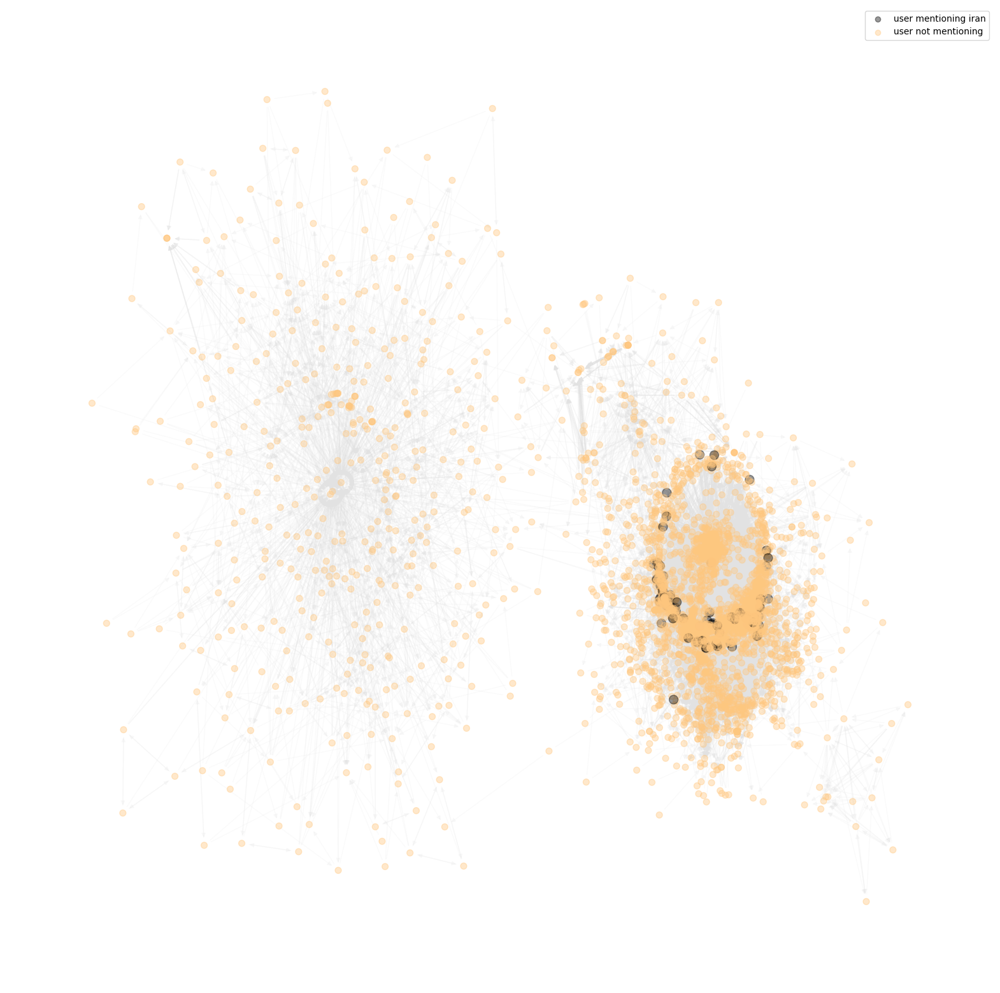

In [211]:
plot_graph(dir_mentions_graph_bots, iran_colors, 
           color_labels={'user mentioning iran':0.0, 'user not mentioning' : 1.0},
           filename='iran-users-dir-graph.png',
           alpha_edges=0.15, alpha_nodes=0.4, node_size=iran_size)

In [201]:
worldcup_community_subgraph = dir_mentions_graph_bots.subgraph(list(c[0]))

In [187]:
set(worldcup_community_subgraph.nodes()).intersection(c[0])

2224

In [208]:
world_cub_iran_colors = [float(not node in df_iran.id.tolist()) for node in worldcup_community_subgraph]

In [207]:
Counter(world_cub_iran_colors)

Counter({1.0: 2142, 0.0: 82})

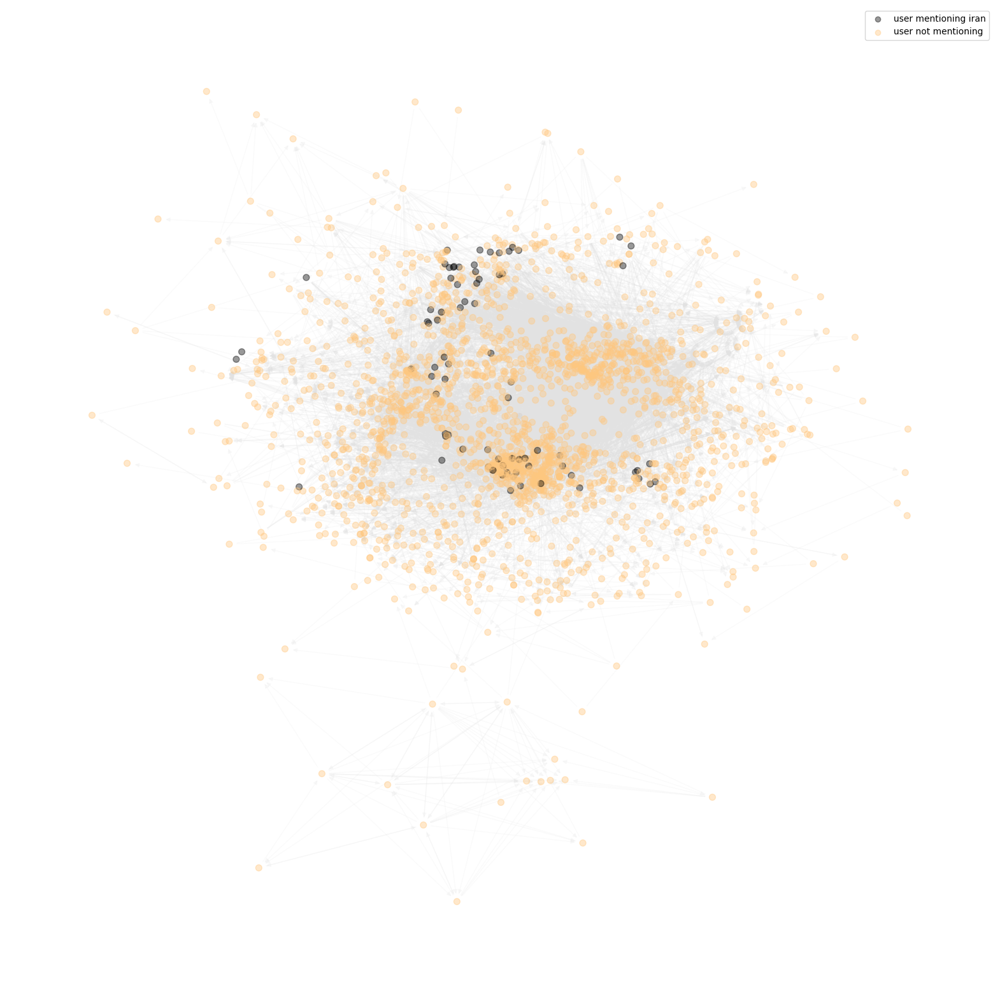

In [210]:
plot_graph(worldcup_community_subgraph, world_cub_iran_colors,
           color_labels={'user mentioning iran':0.0, 'user not mentioning' : 1.0},
           filename='iran-users-worldcup-community-subgraph.png',
           alpha_edges=0.15, alpha_nodes=0.4)

In [146]:
iran_subgraph = dir_mentions_graph_bots.subgraph(df_iran.id)

In [155]:
extended_subgraph_nodes = []

for node in iran_subgraph.nodes:
    neighbors = dir_mentions_graph_bots.neighbors(node)
    extended_subgraph_nodes.extend(neighbors)

In [167]:
iran_subgraph_extended = dir_mentions_graph_bots.subgraph(set(extended_subgraph_nodes).union(set(iran_subgraph.nodes)))

In [198]:
iran_subgraph_colors = [int(not node in iran_subgraph.nodes) for node in iran_subgraph_extended.nodes]

In [169]:
Counter(iran_subgraph_colors)

Counter({0: 231, 1: 85})

In [170]:
egde_colors_subgraph = []

for edge in iran_extended_subgraph.edges():
    # if the edge contains iran user
    n_nodes_iran = len(set(iran_subgraph.nodes).intersection(set(edge))) 
    if n_nodes_iran == 1:
        egde_colors_subgraph.append(plt.cm.Reds(.35))
    else:
        egde_colors_subgraph.append(plt.cm.Reds(.8))

In [195]:
len(iran_extended_subgraph.nodes)

316

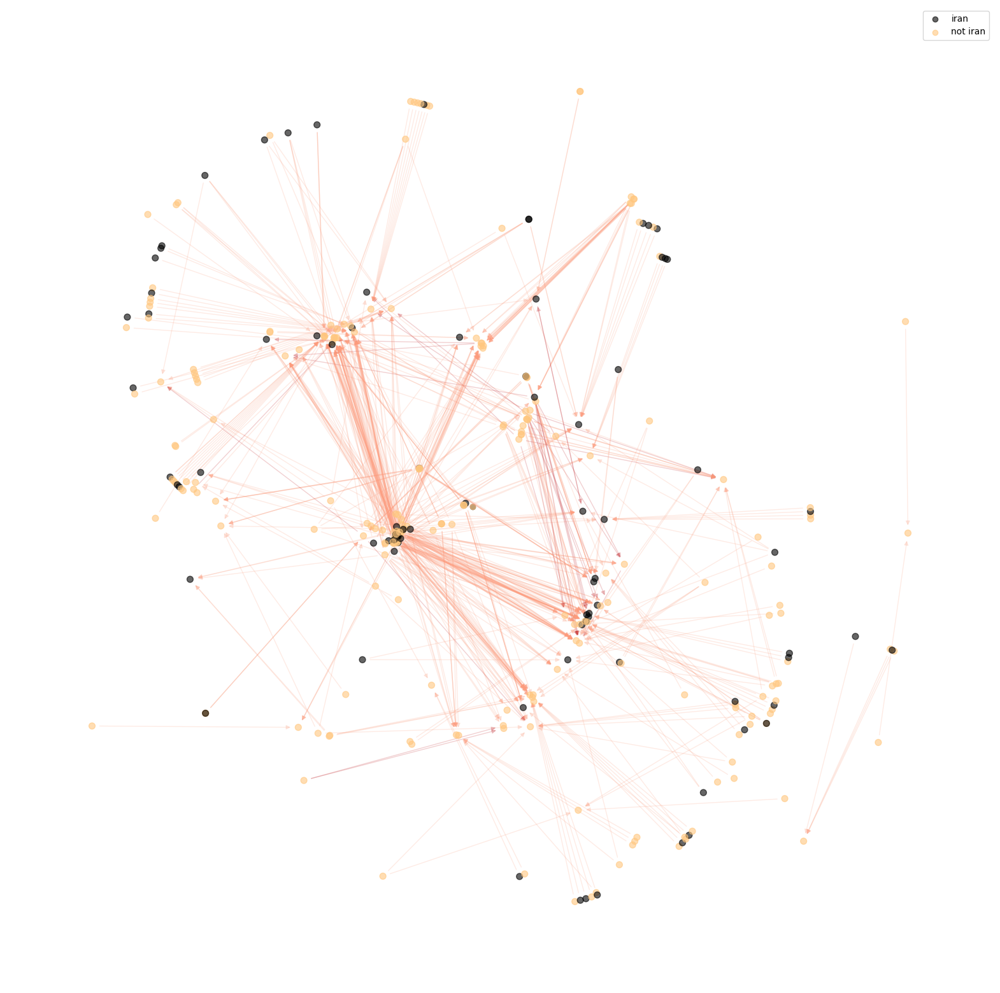

In [200]:
plot_graph(iran_extended_subgraph, iran_subgraph_colors, 
           color_labels={'iran': 0., 'not iran': 1.}, 
           edge_color=egde_colors_subgraph, alpha_edges=0.2)

In [102]:
egde_colors = []

for edge in dir_mentions_graph_bots.edges():
    # if the edge contains iran user
    n_nodes_iran = len(set(df_iran.id).intersection(set(edge))) 
    if n_nodes_iran == 1:
        egde_colors.append(plt.cm.Reds(.35))
    elif n_nodes_iran == 2:
        egde_colors.append(plt.cm.Reds(.8))
    else:
        egde_colors.append(plt.cm.Greys(0.1))

NameError: name 'iran_subgraph' is not defined